<a href="https://colab.research.google.com/github/Karroat/Cyclone-Analysis/blob/main/cyccharanalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Packages**

In [ ]:
# !pip install h5py
!pip install basemap

In [ ]:
from mpl_toolkits.basemap import Basemap, shiftgrid
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import math
import h5py
import os
import re
import csv
import cv2
import glob
import random
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.colors import LinearSegmentedColormap
from datetime import datetime, timedelta
from scipy.interpolate import UnivariateSpline

In [ ]:
def create_folder(mawar_folder):
    # Define subfolders
    subfolders = ['tables', 'plots', 'direction_fig', 'graphs', 'csvcyclones', 'least_10_windspeeds']

    # Loop through subfolders
    for subfolder in subfolders:
        subfolder_path = os.path.join(mawar_folder, subfolder)
        # Check if the subfolder exists
        if not os.path.exists(subfolder_path):
            # Create the subfolder if it doesn't exist
            os.makedirs(subfolder_path)
            print(f"Subfolder '{subfolder}' created inside '{mawar_folder}'.")
        else:
            print(f"Subfolder '{subfolder}' already exists inside '{mawar_folder}'.")


def create_folders(folder_path):

    # Check if the main folder exists
    if not os.path.exists(folder_path):
        # Create the main folder if it doesn't exist
        os.makedirs(folder_path)
        print(f"Folder '{folder_path}' created.")

    # Create 'mawar' folder inside 'cyclone'
    # mawar_folder = os.path.join(folder_path, 'mawar')
    mawar_folder = os.path.join(folder_path, '{}'.format(word))
    if not os.path.exists(mawar_folder):
        os.makedirs(mawar_folder)
        print(f"Folder '{word}' created inside '{folder_path}'.")
    create_folder(mawar_folder)  # Corrected function name


# Specify the main folder path
main_folder_path = '/content/drive/MyDrive/Cyclones'

# Call the function to create folders
create_folders(main_folder_path)

Folder 'mawar' created inside '/content/drive/MyDrive/Cyclones'.
Subfolder 'tables' created inside '/content/drive/MyDrive/Cyclones/mawar'.
Subfolder 'plots' created inside '/content/drive/MyDrive/Cyclones/mawar'.
Subfolder 'direction_fig' created inside '/content/drive/MyDrive/Cyclones/mawar'.
Subfolder 'graphs' created inside '/content/drive/MyDrive/Cyclones/mawar'.
Subfolder 'csvcyclones' created inside '/content/drive/MyDrive/Cyclones/mawar'.
Subfolder 'least_10_windspeeds' created inside '/content/drive/MyDrive/Cyclones/mawar'.


# **Functions**

In [ ]:
def gregorian_date_from_julian_day(year, julian_day):
    # Define the Julian day number for January 1st of the given year
    jan1_year = datetime(year, 1, 1)

    # Calculate the date by adding (julian_day - 1) days to January 1st
    date = jan1_year + timedelta(days=julian_day - 1)

    month_name = date.strftime('%b')
    #formated_date = date.strftime('%d-%m-%y')
    formated_date = date.strftime('%d')
    #day_number = date.day

    return month_name, formated_date, date

    # Example usage:
    #year = int(input())
    #julian_day = int(input())
    #month_name, formated_date, date = gregorian_date_from_julian_day(year, julian_day)
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {formated_date}-{month_name}-{year}")
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {month_name} {date.strftime('%d-%m-%Y')} ") # %y-for 23 small year %Y for full year
    #print(f"Date corresponding to the {julian_day}nd day of {year}: {formated_date}({month_name})")


def calculate_total_wind_speed(latitude_requested, longitude_requested, mlats, mlons, mwind_speed):

    lat_diff = np.abs(mlats - latitude_requested)
    lon_diff = np.abs(mlons - longitude_requested)

    # Find the index where the sum of differences is minimized
    total_diff = lat_diff + lon_diff
    min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)

    # Extract the indices for the closest point
    closest_index_0 = min_index[0]
    closest_index_1 = min_index[1]

    return mwind_speed[closest_index_0][closest_index_1], min_index




def cal_vor(lat_points, lon_points, masked_lats, masked_lons, vorticity):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = vorticity[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return vorticity[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def cal_min(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmin(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]

def cal_max(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + max_index[0]][min_col + max_index[1]], min_row + max_index[0], min_col + max_index[1]


def cal_mean(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage = []

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row + 1, min_col:max_col + 1]

    # Calculate the mean of the submatrix
    submatrix_mean = np.nanmean(submatrix)

    # Return the wind speed at the maximum value index and mean of the submatrix
    return submatrix_mean

def cal_max_sec(lat_points, lon_points, masked_lats, masked_lons, masked_wind_speed):
    rage=[]

    for lat_point, lon_point in zip(lat_points, lon_points):
        # Find the indices of the point closest in both latitude and longitude
        lat_diff = np.abs(masked_lats - lat_point)
        lon_diff = np.abs(masked_lons - lon_point)
        # Find the index where the sum of differences is minimized
        total_diff = lat_diff + lon_diff
        min_index = np.unravel_index(total_diff.argmin(), total_diff.shape)
        # print(min_index)
        rage.append(min_index)

    # Extract the indices for the points defining the range
    points = [(rage[i][0], rage[i][1]) for i in range(len(rage))]

    # Extracting row and column indices
    rows = [point[0] for point in points]
    cols = [point[1] for point in points]

    # Determine the range of rows and columns
    min_row = min(rows)
    max_row = max(rows)
    min_col = min(cols)
    max_col = max(cols)

    # Extract submatrix
    submatrix = masked_wind_speed[min_row:max_row+1, min_col:max_col+1]

    # Find the index of the maximum value within the subset_matrix
    max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)


    # Mask the maximum value
    submatrix[max_index[0], max_index[1]] = np.nan

    # Find the index of the new maximum value
    second_max_index = np.unravel_index(np.nanargmax(submatrix), submatrix.shape)
    # second_max_value = masked_wind_speed[min_row + second_max_index[0], min_col + second_max_index[1]]

    # # Restore the original value
    # masked_wind_speed[max_index] = max_value

    # return second_max_value

    # Return the wind speed at the maximum value index
    return masked_wind_speed[min_row + second_max_index[0], min_col + second_max_index[1]], min_row + second_max_index[0], min_col + second_max_index[1]

def calculate_direction(a1, a2, b1, b2):
    direction = ""

    if a1 > b1:
        if a2 > b2:
            direction = "S"
        elif a2 < b2:
            direction = "SE"
        else:
            direction = "E"
    elif a1 < b1:
        if a2 > b2:
            direction = "SW"
        elif a2 < b2:
            direction = "N"
        else:
            direction = "W"
    else:
        if a2 > b2:
            direction = "NE"
        elif a2 < b2:
            direction = "NW"
        else:
            direction = "same point"

    return direction

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great-circle distance between two points
    on the Earth's surface given their longitudes and latitudes
    in degrees.

    Returns the distance in kilometers.
    """
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    R = 6371  # Radius of the Earth in kilometers
    distance = R * c

    return "{:.2f}".format(distance)

def get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, fl1 ,fl2, sb11, sb22):
    rmax = haversine(masked_lons[sb11, sb22], masked_lats[sb11, sb22], masked_lons[fl1 ,fl2], masked_lats[fl1 ,fl2])
    return fdate, mon, year, julian_day, adpass, masked_lats[fl1 ,fl2 ], masked_lons[fl1 ,fl2 ], wind_fv, masked_lats[sb11, sb22], masked_lons[sb11, sb22] ,f"{wind_speed_sec:.2f}", rmax, dmaxspeed



# List of files

In [ ]:
### Location of the input file data#####
location = '/content/drive/MyDrive/Cyclones/h5_files/mawar_files'

word = 'mawar'


location = '/content/drive/MyDrive/Cyclones/h5_files/{}_files'.format(word)
cycs_location = '/content/drive/MyDrive/Cyclones/{}'.format(word)  #mawar
filename = "/content/drive/MyDrive/Cyclones/"
table_filename = '/content/drive/MyDrive/Cyclones/{}/tables'.format(word)
folder_path = '/content/drive/MyDrive/Cyclones/{}/csvcyclones'.format(word)
csv_filename = '/content/drive/MyDrive/Cyclones/{}/csvcyclones'.format(word)
least_filename = '/content/drive/MyDrive/Cyclones/{}/least_10_windspeeds'.format(word)



#location = '/content/drive/MyDrive/Cyclones/h5_files/biparjoy_files'

In [ ]:
vertocity_cenetr = []
quadrants_table_min = []
quadrants_table_max = []
quadrants_table_mean = []
colorhexnames = []
day_wise_report=[]
dwr=[]
max_wind_speed_dir_list=[]
max_wind_speed_dir = {}
trackc_lats = []
trackc_lons = []
wind_speed_cyclone_pass = []

## **DEFFUN**

votisity is : 12.21 and its lat and lon are (9.78, 147.32) then its indices are (717, 128) and direction is NS
8.58 10.98 146.12 148.52
[8.0, 10.0, 146.0, 148.0]
quad1-NW
6.64 9.49 143.63
quad2-NE
8.81 11.37 147.36
quad1-SE
9.02 6.76 147.54
quad1-SW
6.08 8.33 143.83
Wind speed data saved to '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
Max Wind speed with lat and lon(8.65, 147.31) this at (717, 128) and the max speed is 33.46 m/s in direction of SE
[10.0, 10.0, 8.0, 8.0, 10.0]
[146.0, 148.0, 148.0, 146.0, 146.0]


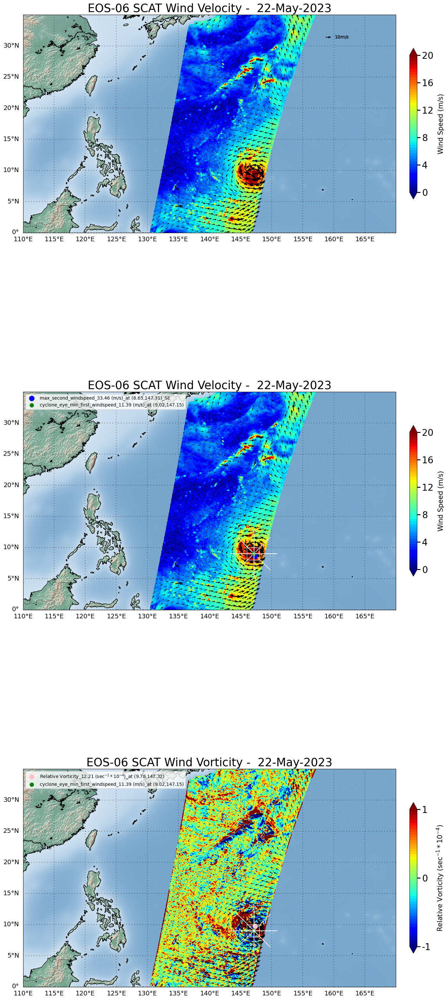

In [ ]:
def ploting_rv(file_path):
    year, julian_day = re.findall(r'(\d{4})(\d{3})_', file_path)[0]
    #print(julian_day, year)
    mon, fdate, d2 = gregorian_date_from_julian_day(int(year), int(julian_day))
    # Extracting NS or SN
    adpass = re.findall(r'_(\w{2})_\d{2}km_', file_path)[0]
    a = 7

    #colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
    colorbar_ticks = [0, 4, 8, 12, 16, 20]
    colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(0.0, 20)


    #colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
    color_ticks = [-24, -16, -8, 0, 8, 16, 24]
    color_labels = ['-24','-16', '-8', '0', '8', '16', '24']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(-20, 20)


    # Read data from HDF5 file
    with h5py.File(file_path, 'r') as f:
        LATITUDE_25 = f['/science_data/Latitude'][:]
        LONGITUDE_25 = f['/science_data/Longitude'][:]
        ws = f['/science_data/Wind_speed_selection'][:]
        wd = f['/science_data/Wind_direction_selection'][:]

        # Data processing
        LATITUDE_25 = LATITUDE_25.astype(float) / 100
        LONGITUDE_25 = LONGITUDE_25.astype(float) / 100
        wd = wd.astype(float) / 100
        ws = ws.astype(float) / 100
        LATITUDE_25[LATITUDE_25 == 327.67] = np.nan
        LONGITUDE_25[LONGITUDE_25 == 655.35] = np.nan
        ws[ws == 327.67] = np.nan
        wd[wd == 655.35] = np.nan

        lat = LATITUDE_25
        lon = LONGITUDE_25
        u = ws * np.cos(np.radians(wd))
        v = ws * np.sin(np.radians(wd))
        #u = ws * np.cos(np.deg2rad(wd))
        #v = ws * np.sin(np.deg2rad(wd))
        # Plotting Wind
        # wind_cal_speed = np.array(ws)
        wind_speed_matrix = np.array(ws)
        zonal_wind_speed_matrix = np.array(u)
        meridional_wind_speed_matrix = np.array(v)


        # print(wind_cal_speed.shape)
        # Replace 'lats' and 'lons' with your latitude and longitude arrays corresponding to the wind speed matrix
        lats = np.array(lat)
        lons = np.array(lon)

        # Create masked arrays to handle NaN values in the wind speed, latitude, and longitude arrays
        # masked_wind_cal_speed = np.ma.masked_invalid(wind_cal_speed)
        masked_wind_speed = np.ma.masked_invalid(wind_speed_matrix)
        masked_lats = np.ma.masked_invalid(lats)
        masked_lons = np.ma.masked_invalid(lons)
        masked_zonal_wind_speed = np.ma.masked_invalid(zonal_wind_speed_matrix)
        masked_meridional_wind_speed = np.ma.masked_invalid(meridional_wind_speed_matrix)

        mmasked_zonal_wind_speed = np.ma.masked_invalid(np.array(ws * np.sin(np.radians(wd))))
        mmasked_meridional_wind_speed = np.ma.masked_invalid(np.array(ws * np.cos(np.radians(wd))))
        # scatterometer wind data (u and v components)
        # Replace these arrays with your actual wind data
        res = 0.125
        DY = res * 6370e3 * 2 * np.pi / 360 * np.ones_like(lat)  # Assuming constant grid spacing in latitude
        DX = DY * np.cos(np.deg2rad(lat))  # Grid spacing in longitude depends on latitude

        u_x = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
        u_y = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
        u_x[1:-1, 1:-1] = u
        u_y[1:-1, 1:-1] = v

        u_x[0, :] = u_x[-2, :]
        u_x[-1, :] = u_x[1, :]
        u_x[:, 0] = u_x[:, -2]
        u_x[:, -1] = u_x[:, 1]
        u_y[0, :] = u_y[-2, :]
        u_y[-1, :] = u_y[1, :]
        u_y[:, 0] = u_y[:, -2]
        u_y[:, -1] = u_y[:, 1]

        wca1 = u_y[2:, 1:-1] - u_y[:-2, 1:-1]
        wca2 = u_x[1:-1, 2:] - u_x[1:-1, :-2]

        vorticity = (wca1) / (2 * DX) - (wca2) / (2 * DY)
        vorticity[vorticity == 0] = np.nan
        vorticity = vorticity * 10**4

        #levels = np.linspace(0.0, 20)

        #levels = [0,4,9,14,16,20,26,30]
        #levels = np.concatenate(([0,1,5],[1,10,10],[10,20,10]))

        # # Define the latitude and longitude bounds

        #mawar
        min_lat = 0.0  # Minimum latitude
        max_lat = 35.0  # Maximum latitude
        min_lon = 110.0  # Minimum longitude
        max_lon = 170.0  # Maximum longitude

        # ### biparjoy
        # min_lat = 0.0  # Minimum latitude
        # max_lat = 60.0  # Maximum latitude
        # min_lon = 20.0  # Minimum longitude
        # max_lon = 80.0  # Maximum longitude


        wlat = [max_lat, max_lat, min_lat, min_lat, max_lat]
        wlon = [min_lon, max_lon, max_lon, min_lon, min_lon]


        # #157
        # wind_lat = [15.0, 15.0, 11.0, 11.0, 15.0]
        # wind_lon = [63.0, 63.0, 68.0, 68.0, 63.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #159
        # wind_lat = [17.0, 17.0, 12.0, 12.0, 17.0]
        # wind_lon = [63.0, 63.0, 68.0, 68.0, 63.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------


        # #161
        # wind_lat = [18.0, 18.0, 14.0, 14.0, 18.0]
        # wind_lon = [64.0, 64.0, 70.0, 70.0, 64.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #162
        # wind_lat = [20.0, 20.0, 15.0, 15.0, 20.0]
        # wind_lon = [66.0, 66.0, 70.0, 70.0, 66.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #163
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)
        # vmin_lat = 17.0  # Minimum latitude
        # vmax_lat = 21.0  # Maximum latitude
        # vmin_lon = 64.0  # Minimum longitude
        # vmax_lon = 67.0  # Maximum longitude

        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

        # # wind_lat = [22.0, 22.0, 17.0, 17.0, 22.0]
        # # wind_lon = [65.0, 68.0, 67.0, 65.0, 65.0]

        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #--------------------------------------------------------------------------------------------------------------------------------------------------------





    ################################################################ mawar
        #142
        wind_lat = [11.0, 11.0, 7.0, 7.0, 11.0]
        wind_lon = [144.0, 149.0, 148.0, 144.0, 144.0]
        wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon, masked_lats, masked_lons, vorticity)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #143
        # wind_lat = [14.0, 14.0, 9.0, 9.0, 14.0]
        # wind_lon = [144.0, 150.0, 150.0, 144.0, 144.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------


        # #144
        # wind_lat = [16.0, 16.0, 10.0, 10.0, 16.0]
        # wind_lon = [142.0, 148.0, 147.0, 142.0, 142.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #145_SN
        # vmin_lat = 8.0  # Minimum latitude
        # vmax_lat = 19.0  # Maximum latitude
        # vmin_lon = 136.0  # Minimum longitude
        # vmax_lon = 144.0  # Maximum longitude

        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

        # # wind_lat = [19.0, 19.0, 12.0, 12.0, 19.0]
        # # wind_lon = [137.0, 145.0, 145.0, 137.0, 137.0]

        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #146
        # wind_lat = [20.0, 20.0, 12.0, 12.0, 20.0]
        # wind_lon = [135.0, 141.0, 141.0, 135.0, 135.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #147_SN
        # vmin_lat = 16.0 # Minimum latitude
        # vmax_lat = 18.0  # Maximum latitude
        # vmin_lon = 128.0  # Minimum longitude
        # vmax_lon = 132.0  # Maximum longitude

        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]
        # # #147
        # # wind_lat = [22.0, 22.0, 14.0, 14.0, 22.0]
        # # wind_lon = [127.0, 136.0, 136.0, 129.0, 127.0]

        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # # 148_SN
        # vmin_lat = 17.0 # Minimum latitude
        # vmax_lat = 19.0  # Maximum latitude
        # vmin_lon = 126.0  # Minimum longitude
        # vmax_lon = 128.0  # Maximum longitude
        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

        # # wind_lat = [22.0, 22.0, 14.0, 14.0, 22.0]
        # # wind_lon = [121.0, 130.0, 131.0, 121.0, 121.0]
        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #149 box-0k
        # wind_lat = [24.0, 24.0, 15.0, 15.0, 24.0]
        # wind_lon = [123.0, 131.0, 130.0, 123.0, 123.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #150_SN
        # vmin_lat = 20.0 # Minimum latitude
        # vmax_lat = 23.0  # Maximum latitude
        # vmin_lon = 124.0  # Minimum longitude
        # vmax_lon = 126.0  # Maximum longitude

        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

        # # wind_lat = [24.0, 24.0, 18.0, 18.0, 24.0]
        # # wind_lon = [121.0, 127.0, 128.0, 128.0, 121.0]
        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #--------------------------------------------------------------------------------------------------------------------------------------------------------

        # #151_SN
        # vmin_lat = 21.0 # Minimum latitude
        # vmax_lat = 24.0  # Maximum latitude
        # vmin_lon = 124.0  # Minimum longitude
        # vmax_lon = 126.0  # Maximum longitude

        # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
        # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

        # # wind_lat = [26.0, 26.0, 19.0, 19.0, 26.0]
        # # wind_lon = [122.0, 130.0, 130.0, 122.0, 122.0]
        # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

        # lat_dot=masked_lats[sb1][sb2]
        # lon_dot=masked_lons[sb1][sb2]

        # vdc=3.75

        # vp11 = round(lat_dot-vdc,2)# min_lat
        # vp22 = round(lat_dot+vdc,2)# max_lat
        # vp33 = round(lon_dot-vdc,2)# min_lon
        # vp44 = round(lon_dot+vdc,2)# max_lon

        # print(vp11, vp22, vp33, vp44)

        # wind_lat = [vp22, vp22, vp11, vp11, vp22]
        # wind_lon = [vp33, vp44, vp44, vp33, vp33]

    #---------------------------------------------------------------------------------------------------------------------------------------------------------

        # # #152
        # wind_lat = [29.0, 29.0, 19.0, 19.0, 29.0]
        # wind_lon = [126.0, 133.0, 133.0, 126.0, 126.0]
        # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)


    #---------------------------------------------------------------------------------------------------------------------------------------------------------

        print("votisity is : {} and its lat and lon are ({}, {}) then its indices are ({}, {}) and direction is {}".format(f"{wind_speed_v:.2f}", masked_lats[sb1][sb2], masked_lons[sb1][sb2], sb1, sb2, adpass))

        lat_dot=masked_lats[sb1][sb2]
        lon_dot=masked_lons[sb1][sb2]
        # Plot box around the red dot

        vd=1.2

        vp1 = round(lat_dot-vd,2)# min_lat
        vp2 = round(lat_dot+vd,2)# max_lat
        vp3 = round(lon_dot-vd,2)# min_lon
        vp4 = round(lon_dot+vd,2)# max_lon

        print(vp1, vp2, vp3, vp4)

    #----------------------------------------------------------------------------------------------------------------------------------------------------------
        # # # #Floor Values

        numbers = [vp1, vp2, vp3, vp4]

        # numbers = [9.58, 12.25, 145.97, 148.37]
        rounded_numbers = []

        for i, num in enumerate(numbers):
            rounded_numbers.append(math.floor(num))
        rounded_numbers = [float(num) for num in rounded_numbers]

        vp1 = rounded_numbers[0]
        vp2 = rounded_numbers[1]
        vp3 = rounded_numbers[2]
        vp4 = rounded_numbers[3]

        print(rounded_numbers)

    #----------------------------------------------------------------------------------------------------------------------------------------------------------

        box_lats = [vp2, vp2, vp1, vp1, vp2]
        box_lons = [vp3, vp4, vp4, vp3, vp3]

        masked_vorticity = np.ma.masked_invalid(vorticity)


        # def get_table():
        #     rmax = haversine(lon_dot, lat_dot, masked_lons[fl1, fl2], masked_lats[fl1, fl2],)
        #     return fdate, mon, year, julian_day, adpass, masked_lats[fl1, fl2], masked_lons[fl1, fl2], wind_fv, lat_dot, lon_dot, f"{wind_speed_v:.2f}", rmax




        wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons, masked_lats, masked_lons, masked_wind_speed)
        wind_speed_cyclone_pass.append(wind_fv)
        trackc_lats.append(masked_lats[fl1, fl2])
        trackc_lons.append(masked_lons[fl1, fl2])
        wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon, masked_lats, masked_lons, masked_wind_speed)
        if(wind_speed_sec>=50.0):
            wind_speed_sec,sb11, sb22 = cal_max_sec(wind_lat, wind_lon, masked_lats, masked_lons, masked_wind_speed)
        lat_max_sec_dot = masked_lats[sb11, sb22]
        lon_max_sec_dot = masked_lons[sb11, sb22]
        dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)


    #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
        P1 = (wind_lat[0], wind_lon[0])
        P2 = (wind_lat[1], wind_lon[1])
        P3 = (wind_lat[2], wind_lon[2])
        P4 = (wind_lat[3], wind_lon[3])

        # Calculate midpoints
        m12 = ((P1[0] + P2[0]) / 2, (P1[1] + P2[1]) / 2)
        m23 = ((P2[0] + P3[0]) / 2, (P2[1] + P3[1]) / 2)
        m34 = ((P3[0] + P4[0]) / 2, (P3[1] + P4[1]) / 2)
        m41 = ((P4[0] + P1[0]) / 2, (P4[1] + P1[1]) / 2)

        c1 = (masked_lats[fl1, fl2], masked_lons[fl1, fl2])

        # QUAD-1
        quad_lat1 = [P1[0], m12[0], c1[0], m41[0], P1[0]]
        quad_lon1 = [P1[1], m12[1], c1[1], m41[1], P1[1]]
        q11, k11, k12 = cal_min(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)
        mq11, mk11, mk12 = cal_max(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)

        if(mq11>=50.0):
            mq11, mk11, mk12 = cal_max_sec(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)

        quad1_mean = cal_mean(quad_lat1, quad_lon1, masked_lats, masked_lons, masked_wind_speed)
        print("quad1-NW")
        # print(quad_lat1, quad_lon1)
        print(q11, masked_lats[k11][k12], masked_lons[k11][k12])

        # QUAD-2
        quad_lat2 = [m12[0], P2[0], m23[0], c1[0], m12[0]]
        quad_lon2 = [m12[1], P2[1], m23[1], c1[1], m12[1]]
        q22, k22, k21 = cal_min(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)
        mq22, mk22, mk21 = cal_max(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)

        if(mq22>=50.0):
            mq22, mk22, mk21 = cal_max_sec(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)

        quad2_mean = cal_mean(quad_lat2, quad_lon2, masked_lats, masked_lons, masked_wind_speed)
        print("quad2-NE")
        # print(quad_lat2, quad_lon2)
        print(q22, masked_lats[k22][k21], masked_lons[k22][k21])


        # QUAD-3
        quad_lat3 = [c1[0], m23[0], P3[0], m34[0], c1[0]]
        quad_lon3 = [c1[1], m23[1], P3[1], m34[1], c1[1]]
        q33, k33, k32 = cal_min(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)
        mq33, mk33, mk32 = cal_max(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)

        if(mq33>=50.0):
            mq33, mk33, mk32 = cal_max_sec(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)

        quad3_mean = cal_mean(quad_lat3, quad_lon3, masked_lats, masked_lons, masked_wind_speed)
        print("quad1-SE")
        # print(quad_lat3, quad_lon3)
        print(q33, masked_lats[k33][k32], masked_lons[k33][k32])


        # QUAD-4
        quad_lat4 = [m41[0], c1[0], m34[0], P4[0], m41[0]]
        quad_lon4 = [m41[1], c1[1], m34[1], P4[1], m41[1]]
        q44, k44, k42 = cal_min(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)
        mq44, mk44, mk42 = cal_max(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)

        if(mq44>=50.0):
            mq44, mk44, mk42 = cal_max_sec(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)

        quad4_mean = cal_mean(quad_lat4, quad_lon4, masked_lats, masked_lons, masked_wind_speed)
        print("quad1-SW")
        # print(quad_lat4, quad_lon4)
        print(q44, masked_lats[k44][k42], masked_lons[k44][k42])


        fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv = get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, fl1 ,fl2, sb11, sb22)
        # windsv = float(windsv)

        quadrants_table_mean.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), quad1_mean, quad2_mean, quad3_mean, quad4_mean))

        # Save the wind speed data to a CSV file

        #table_filename = '/content/drive/MyDrive/Cyclones/mawar/tables/'
        #table_filename = '/content/drive/MyDrive/Cyclones/{}/tables/'.format(word)

        #  'image_binarization.csv')
        #with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
        with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
            writer.writerows(quadrants_table_mean)

        quadrants_table_min.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(q11, masked_lats[k11][k12], masked_lons[k11][k12]), '{}m/s - ({} , {})'.format(q22, masked_lats[k22][k21], masked_lons[k22][k21]), '{}m/s - ({} , {})'.format(q33, masked_lats[k33][k32], masked_lons[k33][k32]), '{}m/s - ({} , {})'.format(q44, masked_lats[k44][k42], masked_lons[k44][k42])))

        # Save the wind speed data to a CSV file
        #with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
        with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
            writer.writerows(quadrants_table_min)

        quadrants_table_max.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(mq11, masked_lats[mk11][mk12], masked_lons[mk11][mk12]), '{}m/s - ({} , {})'.format(mq22, masked_lats[mk22][mk21], masked_lons[mk22][mk21]), '{}m/s - ({} , {})'.format(mq33, masked_lats[mk33][mk32], masked_lons[mk33][mk32]), '{}m/s - ({} , {})'.format(mq44, masked_lats[mk44][mk42], masked_lons[mk44][mk42])))

        # Save the wind speed data to a CSV file
        #with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:
        with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:

            writer = csv.writer(csvfile)
            writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
            writer.writerows(quadrants_table_max)

        #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

        #---------------------------------------------------------------------------------------------------
        #---------------------------------------------------------------------------------------------------
        #---------------------------------------------------------------------------------------------------
        #---------------------------------------------------------------------------------------------------

        fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv = get_table(fdate, mon, year, julian_day, adpass, wind_fv, wind_speed_sec, dmaxspeed, masked_lats, masked_lons, masked_wind_speed, fl1 ,fl2, sb11, sb22)
        windsv = float(windsv)
        vertocity_cenetr.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), latc, lonc, wind_fv, lonv, latv,  "{:.2f}".format(windsv), rmax, direv))

        # Save the wind speed data to a CSV file
        with open(os.path.join(table_filename, 'vertocity_cenetr.csv'), 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Day', 'Latitude_center', 'Longitude_center' , 'Windspeed', 'Latitude_vmax', 'Longitude_vmax', 'Vmax' , 'Rmax', 'VDirection'])
            writer.writerows(vertocity_cenetr)

        #------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

        def haversine(lon1, lat1, lon2, lat2):
            """
            Calculate the great-circle distance between two points
            on the Earth's surface given their longitudes and latitudes
            in degrees.

            Returns the distance in kilometers.
            """
            # Convert decimal degrees to radians
            lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

            # Haversine formula
            dlon = lon2 - lon1
            dlat = lat2 - lat1
            a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
            c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
            R = 6371  # Radius of the Earth in kilometers
            distance = R * c

            return "{:.2f}".format(distance)


        def saving_wind_speed_data(latitude_center, longitude_center , julian_day, adpass):
            # List to store wind speed data for each direction
            wind_speed_table = []

            # Define the number of points in each direction
            num_points = 30
            step_diff = 0.125  # resolution
            # Calculate wind speed for points towards North
            for i in range(1, num_points + 1):
                latitude = latitude_center + step_diff * i
                latitude = int(latitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('North', latitude, longitude_center, wind_speed, distance))


            # Calculate wind speed for points towards South
            for i in range(1, num_points + 1):
                latitude = latitude_center - step_diff * i
                latitude = int(latitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('South', latitude, longitude_center, wind_speed, distance))

            # Calculate wind speed for points towards West
            for i in range(1, num_points + 1):
                longitude = longitude_center - step_diff * i
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('West', latitude_center, longitude, wind_speed, distance))

            # Calculate wind speed for points towards East
            for i in range(1, num_points + 1):
                longitude = longitude_center + step_diff * i
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('East', latitude_center, longitude, wind_speed, distance))

            # Calculate wind speed for points towards NorthEast
            for i in range(1, num_points + 1):
                latitude = latitude_center + step_diff * i
                longitude = longitude_center + step_diff * i
                latitude = int(latitude * 100) / 100
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('NorthEast', latitude, longitude, wind_speed, distance))

            # Calculate wind speed for points towards SouthEast
            for i in range(1, num_points + 1):
                latitude = latitude_center - step_diff * i
                longitude = longitude_center + step_diff * i
                latitude = int(latitude * 100) / 100
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('SouthEast', latitude, longitude, wind_speed, distance))

            # Calculate wind speed for points towards NorthWest
            for i in range(1, num_points + 1):
                latitude = latitude_center + step_diff * i
                longitude = longitude_center - step_diff * i
                latitude = int(latitude * 100) / 100
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('NorthWest', latitude, longitude, wind_speed, distance))

            # Calculate wind speed for points towards SouthWest
            for i in range(1, num_points + 1):
                latitude = latitude_center - step_diff * i
                longitude = longitude_center - step_diff * i
                latitude = int(latitude * 100) / 100
                longitude = int(longitude * 100) / 100
                distance = haversine(longitude_center, latitude_center, longitude, latitude)
                wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
                if np.isnan(wind_speed):
                    continue
                wind_speed_table.append(('SouthWest', latitude, longitude, wind_speed, distance))

        #     # Save the wind speed data to a CSV file
        #     with open('/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass), 'w', newline='') as csvfile:
        #         writer = csv.writer(csvfile)
        #         writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
        #         writer.writerows(wind_speed_table)

        #     print("Wind speed data saved to 'wind_speed_table_{}_{}.csv".format(julian_day, adpass))

        # saving_wind_speed_data(latc, lonc, julian_day, adpass)

            # Save the wind speed data to a CSV file
            #csv_filename = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)
            #csv_filename = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)

            with open(os.path.join(csv_filename, 'wind_speed_table_{}_{}.csv'.format(julian_day, adpass)), 'w', newline='') as csvfile:
            #with open(csv_filename, 'w', newline='') as csvfile:
                writer = csv.writer(csvfile)
                writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
                writer.writerows(wind_speed_table)

            print("Wind speed data saved to '{}'".format(csv_filename))

            return csv_filename

        saving_wind_speed_data(latc, lonc, julian_day, adpass)
        # csv_path = saving_wind_speed_data(latc, lonc, julian_day, adpass)
        # csv_path = r'/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)
        # csv_path = r'/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)

        # print("CSV file saved at:", csv_path)

    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################
    ####################################################################################################################################################################################################


        # #plotting graphs noth,south,east,west,northeast,southwest,northwest,southeast
        # # Plot for South Direction
        # data = pd.read_csv(csv_path)
        # # colors = list(select_colors(len(glob.glob(location + "/*.h5"))).keys())


        # colors = get_hexcodelist()

        # # Plot for South Direction
        # plot_wind_speed_direction(data, "South", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

        # # Plot for North Direction
        # plot_wind_speed_direction(data, "North", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

        # # Plot for East Direction
        # plot_wind_speed_direction(data, "East", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

        # # Plot for West Direction
        # plot_wind_speed_direction(data, "West", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

        # # Plot for NorthEast
        # plot_wind_speed_directions("NorthEast", colors)

        # # Plot for NorthWest
        # plot_wind_speed_directions("NorthWest", colors)

        # # Plot for SouthEast
        # plot_wind_speed_directions("SouthEast", colors)

        # # Plot for SouthWest
        # plot_wind_speed_directions("SouthWest", colors)

        # # csv_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'  # Change this to your CSV directory



    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################
    ####################################################################################################################################################################################################

        # # Main Plot and Sub Plots
        #Plotting......................


        fig = plt.figure(figsize=(18, 40), facecolor='white')
        ax = fig.add_subplot(311)

        colorbar_ticks = [0, 4, 8, 12, 16, 20]
        colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels
        levels = np.linspace(0.0, 20)

        my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
        my_map.drawcoastlines()
        my_map.drawcountries()

        parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
        meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

        my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
        my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

        month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
        #print(julian_day, year)
        plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

        x, y = my_map(masked_lons, masked_lats)

        cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

        arrows = my_map.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
        #arrows = my_map.quiver(x[::a,::a], y[::a,::a], masked_zonal_wind_speed[::a,::a], masked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
        qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

        cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
        #cbar = plt.contour(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
        cbar.outline.set_edgecolor('black')
        cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
        cbar.ax.tick_params(length=7, width=2, color='black')
        cbar.set_ticks(colorbar_ticks)
        cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')
        my_map.shadedrelief()
        plt.subplots_adjust(hspace=0.5)
        # plt.legend(loc='upper left')
        # plt.savefig('/content/drive/MyDrive/Cyclones/{}/plots/mapall_{}_{}.png'.format(word,julian_day,adpass), dpi=100)



        ###################################################################################################################################################################################################

        ax = fig.add_subplot(312)

        my_map1 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
        my_map1.drawcoastlines()
        my_map1.drawcountries()

        parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
        meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

        my_map1.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
        my_map1.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

        month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
        #print(julian_day, year)
        # plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
        plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
        x, y = my_map1(masked_lons, masked_lats)

        # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
        cnt = my_map1.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

        arrows = my_map1.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                                  angles='uv', scale=0.6)

        wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons, masked_lats, masked_lons, masked_wind_speed)
        # print(box_lats)
        # print(box_lons)

        def calculate_coords(center_longitude, center_latitude, angle, distance):
            angle_rad = np.radians(angle)
            delta_longitude = distance * np.sin(angle_rad)
            delta_latitude = distance * np.cos(angle_rad)
            new_longitude = center_longitude + delta_longitude
            new_latitude = center_latitude + delta_latitude
            return new_longitude, new_latitude

        # Define the number of points in each direction
        num_points = 3.75

        # Define the center point
        center_longitude = masked_lons[fl1, fl2]
        center_latitude = masked_lats[fl1, fl2]

        dir_color='white'

        # Plot x-axis
        plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
        plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

        # Plot y-axis
        plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
        plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction


        # Add diagonal directions
        diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

        # North-East
        ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

        # North-West
        nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

        # South-East
        se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

        # South-West
        sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')

        # xdot, ydot = my_map1(lon_dot, lat_dot)
        # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='max_vorticity_{} (m/s)_at ({},{})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))
        #plt.plot(wind_lon, wind_lat, color='white', linewidth=1)
        wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon, masked_lats, masked_lons, masked_wind_speed)
        if(wind_speed_sec>=50.0):
            wind_speed_sec,sb11, sb22 = cal_max_sec(wind_lat, wind_lon, masked_lats, masked_lons, masked_wind_speed)
        lat_max_sec_dot = masked_lats[sb11, sb22]
        lon_max_sec_dot = masked_lons[sb11, sb22]
        dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)
        x_max_sec_dot, y_max_sec_dot = my_map(lon_max_sec_dot, lat_max_sec_dot)
        ax.scatter(x_max_sec_dot, y_max_sec_dot, marker='o', color='blue', s=120, transform=ax.transData, label='max_second_windspeed_{} (m/s)_at ({},{})_{}'.format(wind_speed_sec, lat_max_sec_dot, lon_max_sec_dot,dmaxspeed))
        print("Max Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s in direction of {}".format(lat_max_sec_dot, lon_max_sec_dot, sb1, sb2, wind_speed_sec,dmaxspeed))


        plt.plot(box_lons, box_lats, color='white', linewidth=1)
        xdot_cen, ydot_cen = my_map1(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
        # plt.plot(box_lons, box_lats, color='white', linewidth=1)
        ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))
        # Function to calculate latitude and longitude for a given angle


        qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

        cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
        cbar.outline.set_edgecolor('black')
        cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
        cbar.ax.tick_params(length=7, width=2, color='black')
        cbar.set_ticks(colorbar_ticks)
        cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

        my_map.shadedrelief()
        plt.legend(loc='upper left')
        plt.subplots_adjust(hspace=0.5)
        # plt.savefig('/content/drive/MyDrive/Cyclones/{}/plots/mapallcenter_{}_{}.png'.format(word,julian_day,adpass), dpi=100)

        # # Adjust the space between subplots
        # plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################
    ##################################################################################################################################################################################################

    #Plotting.............................

        ax = fig.add_subplot(313)
        color_ticks = [ -1, 0, 1]
        color_labels = ['-1', '0', '1']  # Corresponding labels were these lables genuine if so then how was it decided

        levels = np.linspace(-1, 1)

        my_map2 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
        my_map2.drawcoastlines()
        my_map2.drawcountries()

        parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
        meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

        my_map2.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
        my_map2.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

        month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
        #print(julian_day, year)
        plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

        x, y = my_map2(masked_lons, masked_lats)

        # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
        cnt = my_map2.contourf(x, y, masked_vorticity, levels=levels, cmap='jet', extend='both')

        arrows = my_map2.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                                  angles='uv', scale=0.6)



        xdot, ydot = my_map2(lon_dot, lat_dot)
        ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} {}_at ({},{})'.format(f"{wind_speed_v:.2f}", "($\mathrm{sec^{-1}} * {10^{-4}}$)", lat_dot, lon_dot))
        # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} ($\mathrm{{sec^{-1}}} \times 10^{{-4}}$) at ({}, {})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))



        wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons, masked_lats, masked_lons, masked_wind_speed)
        print(box_lats)
        print(box_lons)

        plt.plot(box_lons, box_lats, color='white', linewidth=1)
        xdot_cen, ydot_cen = my_map2(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
        # plt.plot(box_lons, box_lats, color='white', linewidth=1)
        ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))

        def calculate_coords(center_longitude, center_latitude, angle, distance):
            angle_rad = np.radians(angle)
            delta_longitude = distance * np.sin(angle_rad)
            delta_latitude = distance * np.cos(angle_rad)
            new_longitude = center_longitude + delta_longitude
            new_latitude = center_latitude + delta_latitude
            return new_longitude, new_latitude

        # Define the number of points in each direction
        num_points = 3.75

        # Define the center point
        center_longitude = xdot_cen
        center_latitude = ydot_cen

        dir_color='white'

        # Plot x-axis
        plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
        plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

        # Plot y-axis
        plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
        plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction

        # Add diagonal directions
        diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

        # North-East
        ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

        # North-West
        nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

        # South-East
        se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

        # South-West
        sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
        plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')


        qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

        cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
        cbar.outline.set_edgecolor('black')
        # cbar.set_label('Relative Vorticity (sec^-1 * 10^-4)', fontsize=15, color='black', labelpad=10)
        cbar.set_label('Relative Vorticity ($\mathrm{sec^{-1}} * {10^{-4}}$)', fontsize=15, color='black', labelpad=10)


        cbar.ax.tick_params(length=7, width=2, color='black')
        cbar.set_ticks(color_ticks)
        cbar.set_ticklabels(color_labels, fontsize=20, color='black')

        my_map.shadedrelief()

        plt.legend(loc='upper left')  # Adjust 'upper left' as needed
        # os.chdir('/content/drive/MyDrive/data/student_bhuvan_kandhi/marwar_images')
        # # Save the image as a file (in this case, as a PNG file)

        # Adjust the space between subplots
        plt.subplots_adjust(hspace=0.5)  # Adjust vertical space


        #plt.savefig('/content/drive/MyDrive/Cyclones/mawar/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)
        #plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)
        plt.savefig('/content/drive/MyDrive/Cyclones/{}/plots/mapallrv_{}_{}.png'.format(word,julian_day,adpass), dpi=100)


        plt.show()



#location = '/home/shashank/Desktop/bhoonidhi/input_data'
os.chdir(location)

file_path = "E06SCTL2B2023142_02558_02559_NS_12km_2023-142T20-40-49_v1.0.2.h5" #ok floor
#file_path = "E06SCTL2B2023143_02572_02573_NS_12km_2023-143T04-48-38_v1.0.2.h5" #ok-pass
#ile_path = "E06SCTL2B2023144_02587_02588_NS_12km_2023-144T20-09-52_v1.0.2.h5" #ok-pass
#file_path = "E06SCTL2B2023145_02608_02609_SN_12km_2023-145T19-58-19_v1.0.2.h5" #ok-pass-use special lats and remove floor
#file_path = "E06SCTL2B2023146_02616_02617_NS_12km_2023-149T11-02-04_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023147_02637_02638_SN_12km_2023-147T20-03-32_v1.0.2.h5" #ok-pass use special lats and keep or remove floor
#file_path = "E06SCTL2B2023148_02652_02653_SN_12km_2023-148T16-23-41_v1.0.2.h5" #ok-pass use special lats and remove floor
#file_path = "E06SCTL2B2023149_02660_02661_NS_12km_2023-149T04-45-18_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023150_02681_02682_SN_12km_2023-150T16-33-41_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023151_02689_02690_NS_12km_2023-151T04-53-12_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023152_02703_02704_NS_12km_2023-152T04-05-02_v1.0.2.h5" #ok - dont keep floor

#----------------------------------------------------------------------------------------------------------------------------

#biparjoy

#file_path = 'E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5'#ok floor
#file_path = 'E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5' #use special lats and keep floor


#----------------------------------------------------------------------------------------------------------------------------


ploting_rv(file_path)

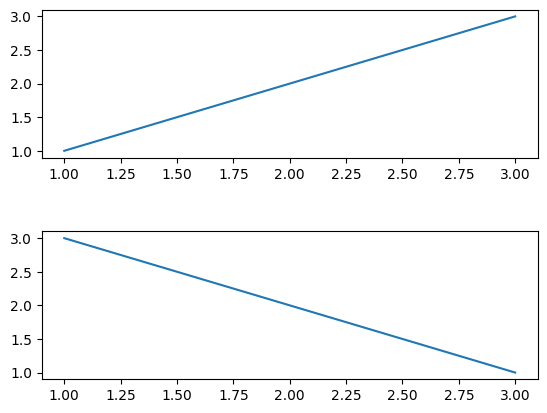

In [ ]:
import matplotlib.pyplot as plt

# Create two subplots in a 2x1 grid
plt.subplot(211)
plt.plot([1, 2, 3], [1, 2, 3])

plt.subplot(212)
plt.plot([1, 2, 3], [3, 2, 1])

# Adjust the space between subplots
plt.subplots_adjust(hspace=0.5)  # Adjust vertical space

plt.show()


16.24 23.74 63.06 70.56
votisity is : 11.87 and its lat and lon are (19.99, 66.81) then its indices are (624, 121) and direction is NS
18.79 21.19 65.61 68.01
quad1-NW
0.0 24.32 63.47
quad2-NE
4.83 23.72 67.09
quad1-SE
7.76 19.54 67.17
quad1-SW
7.58 20.37 63.19
Wind speed data saved to '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones/wind_speed_table_163_NS.csv'
Max Wind speed with lat and lon(19.49, 67.48) this at (624, 121) and the max speed is 33.13 m/s in direction of SE
[21.19, 21.19, 18.79, 18.79, 21.19]
[65.61, 68.01, 68.01, 65.61, 65.61]


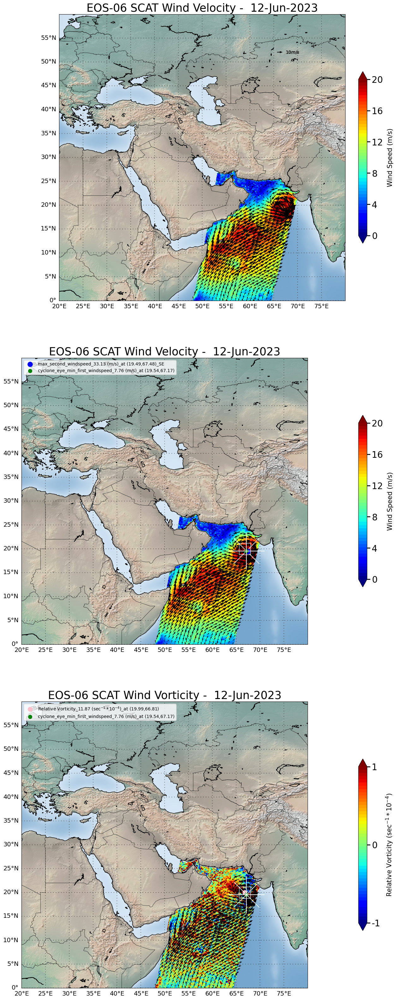

In [ ]:
#location = '/home/shashank/Desktop/bhoonidhi/input_data'
os.chdir(location)

file_path = "E06SCTL2B2023142_02558_02559_NS_12km_2023-142T20-40-49_v1.0.2.h5" #ok floor
#file_path = "E06SCTL2B2023143_02572_02573_NS_12km_2023-143T04-48-38_v1.0.2.h5" #ok-pass
#ile_path = "E06SCTL2B2023144_02587_02588_NS_12km_2023-144T20-09-52_v1.0.2.h5" #ok-pass
#file_path = "E06SCTL2B2023145_02608_02609_SN_12km_2023-145T19-58-19_v1.0.2.h5" #ok-pass-use special lats and remove floor
#file_path = "E06SCTL2B2023146_02616_02617_NS_12km_2023-149T11-02-04_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023147_02637_02638_SN_12km_2023-147T20-03-32_v1.0.2.h5" #ok-pass use special lats and keep or remove floor
#file_path = "E06SCTL2B2023148_02652_02653_SN_12km_2023-148T16-23-41_v1.0.2.h5" #ok-pass use special lats and remove floor
#file_path = "E06SCTL2B2023149_02660_02661_NS_12km_2023-149T04-45-18_v1.0.2.h5" #ok remove floor
#file_path = "E06SCTL2B2023150_02681_02682_SN_12km_2023-150T16-33-41_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023151_02689_02690_NS_12km_2023-151T04-53-12_v1.0.2.h5" #ok-pass use special lats and keep floor
#file_path = "E06SCTL2B2023152_02703_02704_NS_12km_2023-152T04-05-02_v1.0.2.h5" #ok - dont keep floor

#----------------------------------------------------------------------------------------------------------------------------

#biparjoy

#file_path = 'E06SCTL2B2023157_02778_02779_NS_12km_2023-157T11-24-35_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023159_02807_02808_NS_12km_2023-159T09-33-31_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023161_02836_02837_NS_12km_2023-161T19-38-34_v1.0.2.h5' #ok floor
#file_path = 'E06SCTL2B2023162_02850_02851_NS_12km_2023-162T20-44-12_v1.0.2.h5'#ok floor
#file_path = 'E06SCTL2B2023163_02865_02866_NS_12km_2023-163T09-48-17_v1.0.2.h5' #use special lats and keep floor


#----------------------------------------------------------------------------------------------------------------------------


year, julian_day = re.findall(r'(\d{4})(\d{3})_', file_path)[0]
#print(julian_day, year)
mon, fdate, d2 = gregorian_date_from_julian_day(int(year), int(julian_day))
# Extracting NS or SN
adpass = re.findall(r'_(\w{2})_\d{2}km_', file_path)[0]
a = 7

#colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
colorbar_ticks = [0, 4, 8, 12, 16, 20]
colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels were these lables genuine if so then how was it decided

levels = np.linspace(0.0, 20)


#colorbar_ticks = [0,0.2,0.4,0.6,0.8,1,1.5,2,4,5,6,7,8,9,14,16,18,20,23,26,30]
color_ticks = [-24, -16, -8, 0, 8, 16, 24]
color_labels = ['-24','-16', '-8', '0', '8', '16', '24']  # Corresponding labels were these lables genuine if so then how was it decided

levels = np.linspace(-20, 20)


# Read data from HDF5 file
with h5py.File(file_path, 'r') as f:
    LATITUDE_25 = f['/science_data/Latitude'][:]
    LONGITUDE_25 = f['/science_data/Longitude'][:]
    ws = f['/science_data/Wind_speed_selection'][:]
    wd = f['/science_data/Wind_direction_selection'][:]

    # Data processing
    LATITUDE_25 = LATITUDE_25.astype(float) / 100
    LONGITUDE_25 = LONGITUDE_25.astype(float) / 100
    wd = wd.astype(float) / 100
    ws = ws.astype(float) / 100
    LATITUDE_25[LATITUDE_25 == 327.67] = np.nan
    LONGITUDE_25[LONGITUDE_25 == 655.35] = np.nan
    ws[ws == 327.67] = np.nan
    wd[wd == 655.35] = np.nan

    lat = LATITUDE_25
    lon = LONGITUDE_25
    u = ws * np.cos(np.radians(wd))
    v = ws * np.sin(np.radians(wd))
    #u = ws * np.cos(np.deg2rad(wd))
    #v = ws * np.sin(np.deg2rad(wd))
    # Plotting Wind
    # wind_cal_speed = np.array(ws)
    wind_speed_matrix = np.array(ws)
    zonal_wind_speed_matrix = np.array(u)
    meridional_wind_speed_matrix = np.array(v)


    # print(wind_cal_speed.shape)
    # Replace 'lats' and 'lons' with your latitude and longitude arrays corresponding to the wind speed matrix
    lats = np.array(lat)
    lons = np.array(lon)

    # Create masked arrays to handle NaN values in the wind speed, latitude, and longitude arrays
    # masked_wind_cal_speed = np.ma.masked_invalid(wind_cal_speed)
    masked_wind_speed = np.ma.masked_invalid(wind_speed_matrix)
    masked_lats = np.ma.masked_invalid(lats)
    masked_lons = np.ma.masked_invalid(lons)
    masked_zonal_wind_speed = np.ma.masked_invalid(zonal_wind_speed_matrix)
    masked_meridional_wind_speed = np.ma.masked_invalid(meridional_wind_speed_matrix)

    mmasked_zonal_wind_speed = np.ma.masked_invalid(np.array(ws * np.sin(np.radians(wd))))
    mmasked_meridional_wind_speed = np.ma.masked_invalid(np.array(ws * np.cos(np.radians(wd))))
    # scatterometer wind data (u and v components)
    # Replace these arrays with your actual wind data
    res = 0.125
    DY = res * 6370e3 * 2 * np.pi / 360 * np.ones_like(lat)  # Assuming constant grid spacing in latitude
    DX = DY * np.cos(np.deg2rad(lat))  # Grid spacing in longitude depends on latitude

    u_x = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
    u_y = np.zeros((lat.shape[0] + 2, lat.shape[1] + 2))
    u_x[1:-1, 1:-1] = u
    u_y[1:-1, 1:-1] = v

    u_x[0, :] = u_x[-2, :]
    u_x[-1, :] = u_x[1, :]
    u_x[:, 0] = u_x[:, -2]
    u_x[:, -1] = u_x[:, 1]
    u_y[0, :] = u_y[-2, :]
    u_y[-1, :] = u_y[1, :]
    u_y[:, 0] = u_y[:, -2]
    u_y[:, -1] = u_y[:, 1]

    wca1 = u_y[2:, 1:-1] - u_y[:-2, 1:-1]
    wca2 = u_x[1:-1, 2:] - u_x[1:-1, :-2]

    vorticity = (wca1) / (2 * DX) - (wca2) / (2 * DY)
    vorticity[vorticity == 0] = np.nan
    vorticity = vorticity * 10**4

    #levels = np.linspace(0.0, 20)

    #levels = [0,4,9,14,16,20,26,30]
    #levels = np.concatenate(([0,1,5],[1,10,10],[10,20,10]))

    # # Define the latitude and longitude bounds

    # #mawar
    # min_lat = 0.0  # Minimum latitude
    # max_lat = 35.0  # Maximum latitude
    # min_lon = 110.0  # Minimum longitude
    # max_lon = 170.0  # Maximum longitude

    ### biparjoy
    min_lat = 0.0  # Minimum latitude
    max_lat = 60.0  # Maximum latitude
    min_lon = 20.0  # Minimum longitude
    max_lon = 80.0  # Maximum longitude


    wlat = [max_lat, max_lat, min_lat, min_lat, max_lat]
    wlon = [min_lon, max_lon, max_lon, min_lon, min_lon]


    # #157
    # wind_lat = [15.0, 15.0, 11.0, 11.0, 15.0]
    # wind_lon = [63.0, 63.0, 68.0, 68.0, 63.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #159
    # wind_lat = [17.0, 17.0, 12.0, 12.0, 17.0]
    # wind_lon = [63.0, 63.0, 68.0, 68.0, 63.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------


    # #161
    # wind_lat = [18.0, 18.0, 14.0, 14.0, 18.0]
    # wind_lon = [64.0, 64.0, 70.0, 70.0, 64.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #162
    # wind_lat = [20.0, 20.0, 15.0, 15.0, 20.0]
    # wind_lon = [66.0, 66.0, 70.0, 70.0, 66.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    #163
    wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)
    vmin_lat = 17.0  # Minimum latitude
    vmax_lat = 21.0  # Maximum latitude
    vmin_lon = 64.0  # Minimum longitude
    vmax_lon = 67.0  # Maximum longitude

    vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

    # wind_lat = [22.0, 22.0, 17.0, 17.0, 22.0]
    # wind_lon = [65.0, 68.0, 67.0, 65.0, 65.0]

    wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    lat_dot=masked_lats[sb1][sb2]
    lon_dot=masked_lons[sb1][sb2]

    vdc=3.75

    vp11 = round(lat_dot-vdc,2)# min_lat
    vp22 = round(lat_dot+vdc,2)# max_lat
    vp33 = round(lon_dot-vdc,2)# min_lon
    vp44 = round(lon_dot+vdc,2)# max_lon

    print(vp11, vp22, vp33, vp44)

    wind_lat = [vp22, vp22, vp11, vp11, vp22]
    wind_lon = [vp33, vp44, vp44, vp33, vp33]

#--------------------------------------------------------------------------------------------------------------------------------------------------------





################################################################ mawar
    # #142
    # wind_lat = [11.0, 11.0, 7.0, 7.0, 11.0]
    # wind_lon = [144.0, 149.0, 148.0, 144.0, 144.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #143
    # wind_lat = [14.0, 14.0, 9.0, 9.0, 14.0]
    # wind_lon = [144.0, 150.0, 150.0, 144.0, 144.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------


    # #144
    # wind_lat = [16.0, 16.0, 10.0, 10.0, 16.0]
    # wind_lon = [142.0, 148.0, 147.0, 142.0, 142.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #145_SN
    # vmin_lat = 8.0  # Minimum latitude
    # vmax_lat = 19.0  # Maximum latitude
    # vmin_lon = 136.0  # Minimum longitude
    # vmax_lon = 144.0  # Maximum longitude

    # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

    # # wind_lat = [19.0, 19.0, 12.0, 12.0, 19.0]
    # # wind_lon = [137.0, 145.0, 145.0, 137.0, 137.0]

    # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    # lat_dot=masked_lats[sb1][sb2]
    # lon_dot=masked_lons[sb1][sb2]

    # vdc=3.75

    # vp11 = round(lat_dot-vdc,2)# min_lat
    # vp22 = round(lat_dot+vdc,2)# max_lat
    # vp33 = round(lon_dot-vdc,2)# min_lon
    # vp44 = round(lon_dot+vdc,2)# max_lon

    # print(vp11, vp22, vp33, vp44)

    # wind_lat = [vp22, vp22, vp11, vp11, vp22]
    # wind_lon = [vp33, vp44, vp44, vp33, vp33]

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #146
    # wind_lat = [20.0, 20.0, 12.0, 12.0, 20.0]
    # wind_lon = [135.0, 141.0, 141.0, 135.0, 135.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #147_SN
    # vmin_lat = 16.0 # Minimum latitude
    # vmax_lat = 18.0  # Maximum latitude
    # vmin_lon = 128.0  # Minimum longitude
    # vmax_lon = 132.0  # Maximum longitude

    # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]
    # # #147
    # # wind_lat = [22.0, 22.0, 14.0, 14.0, 22.0]
    # # wind_lon = [127.0, 136.0, 136.0, 129.0, 127.0]

    # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    # lat_dot=masked_lats[sb1][sb2]
    # lon_dot=masked_lons[sb1][sb2]

    # vdc=3.75

    # vp11 = round(lat_dot-vdc,2)# min_lat
    # vp22 = round(lat_dot+vdc,2)# max_lat
    # vp33 = round(lon_dot-vdc,2)# min_lon
    # vp44 = round(lon_dot+vdc,2)# max_lon

    # print(vp11, vp22, vp33, vp44)

    # wind_lat = [vp22, vp22, vp11, vp11, vp22]
    # wind_lon = [vp33, vp44, vp44, vp33, vp33]

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # # 148_SN
    # vmin_lat = 17.0 # Minimum latitude
    # vmax_lat = 19.0  # Maximum latitude
    # vmin_lon = 126.0  # Minimum longitude
    # vmax_lon = 128.0  # Maximum longitude
    # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

    # # wind_lat = [22.0, 22.0, 14.0, 14.0, 22.0]
    # # wind_lon = [121.0, 130.0, 131.0, 121.0, 121.0]
    # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    # lat_dot=masked_lats[sb1][sb2]
    # lon_dot=masked_lons[sb1][sb2]

    # vdc=3.75

    # vp11 = round(lat_dot-vdc,2)# min_lat
    # vp22 = round(lat_dot+vdc,2)# max_lat
    # vp33 = round(lon_dot-vdc,2)# min_lon
    # vp44 = round(lon_dot+vdc,2)# max_lon

    # print(vp11, vp22, vp33, vp44)

    # wind_lat = [vp22, vp22, vp11, vp11, vp22]
    # wind_lon = [vp33, vp44, vp44, vp33, vp33]

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #149 box-0k
    # wind_lat = [24.0, 24.0, 15.0, 15.0, 24.0]
    # wind_lon = [123.0, 131.0, 130.0, 123.0, 123.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #150_SN
    # vmin_lat = 20.0 # Minimum latitude
    # vmax_lat = 23.0  # Maximum latitude
    # vmin_lon = 124.0  # Minimum longitude
    # vmax_lon = 126.0  # Maximum longitude

    # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

    # # wind_lat = [24.0, 24.0, 18.0, 18.0, 24.0]
    # # wind_lon = [121.0, 127.0, 128.0, 128.0, 121.0]
    # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    # lat_dot=masked_lats[sb1][sb2]
    # lon_dot=masked_lons[sb1][sb2]

    # vdc=3.75

    # vp11 = round(lat_dot-vdc,2)# min_lat
    # vp22 = round(lat_dot+vdc,2)# max_lat
    # vp33 = round(lon_dot-vdc,2)# min_lon
    # vp44 = round(lon_dot+vdc,2)# max_lon

    # print(vp11, vp22, vp33, vp44)

    # wind_lat = [vp22, vp22, vp11, vp11, vp22]
    # wind_lon = [vp33, vp44, vp44, vp33, vp33]

#--------------------------------------------------------------------------------------------------------------------------------------------------------

    # #151_SN
    # vmin_lat = 21.0 # Minimum latitude
    # vmax_lat = 24.0  # Maximum latitude
    # vmin_lon = 124.0  # Minimum longitude
    # vmax_lon = 126.0  # Maximum longitude

    # vlat = [vmax_lat, vmax_lat, vmin_lat, vmin_lat, vmax_lat]
    # vlon = [vmin_lon, vmax_lon, vmax_lon, vmin_lon, vmin_lon]

    # # wind_lat = [26.0, 26.0, 19.0, 19.0, 26.0]
    # # wind_lon = [122.0, 130.0, 130.0, 122.0, 122.0]
    # wind_speed_v, sb1, sb2 = cal_vor(vlat, vlon)

    # lat_dot=masked_lats[sb1][sb2]
    # lon_dot=masked_lons[sb1][sb2]

    # vdc=3.75

    # vp11 = round(lat_dot-vdc,2)# min_lat
    # vp22 = round(lat_dot+vdc,2)# max_lat
    # vp33 = round(lon_dot-vdc,2)# min_lon
    # vp44 = round(lon_dot+vdc,2)# max_lon

    # print(vp11, vp22, vp33, vp44)

    # wind_lat = [vp22, vp22, vp11, vp11, vp22]
    # wind_lon = [vp33, vp44, vp44, vp33, vp33]

#---------------------------------------------------------------------------------------------------------------------------------------------------------

    # # #152
    # wind_lat = [29.0, 29.0, 19.0, 19.0, 29.0]
    # wind_lon = [126.0, 133.0, 133.0, 126.0, 126.0]
    # wind_speed_v, sb1, sb2 = cal_vor(wlat, wlon)


#---------------------------------------------------------------------------------------------------------------------------------------------------------

    print("votisity is : {} and its lat and lon are ({}, {}) then its indices are ({}, {}) and direction is {}".format(f"{wind_speed_v:.2f}", masked_lats[sb1][sb2], masked_lons[sb1][sb2], sb1, sb2, adpass))

    lat_dot=masked_lats[sb1][sb2]
    lon_dot=masked_lons[sb1][sb2]
    # Plot box around the red dot

    vd=1.2

    vp1 = round(lat_dot-vd,2)# min_lat
    vp2 = round(lat_dot+vd,2)# max_lat
    vp3 = round(lon_dot-vd,2)# min_lon
    vp4 = round(lon_dot+vd,2)# max_lon

    print(vp1, vp2, vp3, vp4)

#----------------------------------------------------------------------------------------------------------------------------------------------------------
    # # # #Floor Values

    # numbers = [vp1, vp2, vp3, vp4]

    # # numbers = [9.58, 12.25, 145.97, 148.37]
    # rounded_numbers = []

    # for i, num in enumerate(numbers):
    #     rounded_numbers.append(math.floor(num))
    # rounded_numbers = [float(num) for num in rounded_numbers]

    # vp1 = rounded_numbers[0]
    # vp2 = rounded_numbers[1]
    # vp3 = rounded_numbers[2]
    # vp4 = rounded_numbers[3]

    # print(rounded_numbers)

#----------------------------------------------------------------------------------------------------------------------------------------------------------

    box_lats = [vp2, vp2, vp1, vp1, vp2]
    box_lons = [vp3, vp4, vp4, vp3, vp3]

    masked_vorticity = np.ma.masked_invalid(vorticity)


    # def get_table():
    #     rmax = haversine(lon_dot, lat_dot, masked_lons[fl1, fl2], masked_lats[fl1, fl2],)
    #     return fdate, mon, year, julian_day, adpass, masked_lats[fl1, fl2], masked_lons[fl1, fl2], wind_fv, lat_dot, lon_dot, f"{wind_speed_v:.2f}", rmax




    wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    wind_speed_cyclone_pass.append(wind_fv)
    trackc_lats.append(masked_lats[fl1, fl2])
    trackc_lons.append(masked_lons[fl1, fl2])
    wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
    if(wind_speed_sec>=50.0):
        wind_speed_sec,sb11, sb22 = cal_max_sec(wind_lat, wind_lon)
    lat_max_sec_dot = masked_lats[sb11, sb22]
    lon_max_sec_dot = masked_lons[sb11, sb22]
    dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)


#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
    P1 = (wind_lat[0], wind_lon[0])
    P2 = (wind_lat[1], wind_lon[1])
    P3 = (wind_lat[2], wind_lon[2])
    P4 = (wind_lat[3], wind_lon[3])

    # Calculate midpoints
    m12 = ((P1[0] + P2[0]) / 2, (P1[1] + P2[1]) / 2)
    m23 = ((P2[0] + P3[0]) / 2, (P2[1] + P3[1]) / 2)
    m34 = ((P3[0] + P4[0]) / 2, (P3[1] + P4[1]) / 2)
    m41 = ((P4[0] + P1[0]) / 2, (P4[1] + P1[1]) / 2)

    c1 = (masked_lats[fl1, fl2], masked_lons[fl1, fl2])

    # QUAD-1
    quad_lat1 = [P1[0], m12[0], c1[0], m41[0], P1[0]]
    quad_lon1 = [P1[1], m12[1], c1[1], m41[1], P1[1]]
    q11, k11, k12 = cal_min(quad_lat1, quad_lon1)
    mq11, mk11, mk12 = cal_max(quad_lat1, quad_lon1)

    if(mq11>=50.0):
        mq11, mk11, mk12 = cal_max_sec(quad_lat1, quad_lon1)

    quad1_mean = cal_mean(quad_lat1, quad_lon1)
    print("quad1-NW")
    # print(quad_lat1, quad_lon1)
    print(q11, masked_lats[k11][k12], masked_lons[k11][k12])

    # QUAD-2
    quad_lat2 = [m12[0], P2[0], m23[0], c1[0], m12[0]]
    quad_lon2 = [m12[1], P2[1], m23[1], c1[1], m12[1]]
    q22, k22, k21 = cal_min(quad_lat2, quad_lon2)
    mq22, mk22, mk21 = cal_max(quad_lat2, quad_lon2)

    if(mq22>=50.0):
        mq22, mk22, mk21 = cal_max_sec(quad_lat2, quad_lon2)

    quad2_mean = cal_mean(quad_lat2, quad_lon2)
    print("quad2-NE")
    # print(quad_lat2, quad_lon2)
    print(q22, masked_lats[k22][k21], masked_lons[k22][k21])


    # QUAD-3
    quad_lat3 = [c1[0], m23[0], P3[0], m34[0], c1[0]]
    quad_lon3 = [c1[1], m23[1], P3[1], m34[1], c1[1]]
    q33, k33, k32 = cal_min(quad_lat3, quad_lon3)
    mq33, mk33, mk32 = cal_max(quad_lat3, quad_lon3)

    if(mq33>=50.0):
        mq33, mk33, mk32 = cal_max_sec(quad_lat3, quad_lon3)

    quad3_mean = cal_mean(quad_lat3, quad_lon3)
    print("quad1-SE")
    # print(quad_lat3, quad_lon3)
    print(q33, masked_lats[k33][k32], masked_lons[k33][k32])


    # QUAD-4
    quad_lat4 = [m41[0], c1[0], m34[0], P4[0], m41[0]]
    quad_lon4 = [m41[1], c1[1], m34[1], P4[1], m41[1]]
    q44, k44, k42 = cal_min(quad_lat4, quad_lon4)
    mq44, mk44, mk42 = cal_max(quad_lat4, quad_lon4)

    if(mq44>=50.0):
        mq44, mk44, mk42 = cal_max_sec(quad_lat4, quad_lon4)

    quad4_mean = cal_mean(quad_lat4, quad_lon4)
    print("quad1-SW")
    # print(quad_lat4, quad_lon4)
    print(q44, masked_lats[k44][k42], masked_lons[k44][k42])


    fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv= get_table()
    # windsv = float(windsv)

    quadrants_table_mean.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), quad1_mean, quad2_mean, quad3_mean, quad4_mean))

    # Save the wind speed data to a CSV file

    #table_filename = '/content/drive/MyDrive/Cyclones/mawar/tables/'
    table_filename = '/content/drive/MyDrive/Cyclones/biparjoy/tables/'

    #  'image_binarization.csv')
    #with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_mean.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_mean)

    quadrants_table_min.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(q11, masked_lats[k11][k12], masked_lons[k11][k12]), '{}m/s - ({} , {})'.format(q22, masked_lats[k22][k21], masked_lons[k22][k21]), '{}m/s - ({} , {})'.format(q33, masked_lats[k33][k32], masked_lons[k33][k32]), '{}m/s - ({} , {})'.format(q44, masked_lats[k44][k42], masked_lons[k44][k42])))

    # Save the wind speed data to a CSV file
    #with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_min.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_min)

    quadrants_table_max.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), '{}m/s - ({} , {})'.format(mq11, masked_lats[mk11][mk12], masked_lons[mk11][mk12]), '{}m/s - ({} , {})'.format(mq22, masked_lats[mk22][mk21], masked_lons[mk22][mk21]), '{}m/s - ({} , {})'.format(mq33, masked_lats[mk33][mk32], masked_lons[mk33][mk32]), '{}m/s - ({} , {})'.format(mq44, masked_lats[mk44][mk42], masked_lons[mk44][mk42])))

    # Save the wind speed data to a CSV file
    #with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:
    with open(os.path.join(table_filename, 'quadrants_table_max.csv'), 'w', newline='') as csvfile:

        writer = csv.writer(csvfile)
        writer.writerow(['Days', 'Quadrant1-NW', 'Quadrant2-NE', 'Quadrant3-SE', 'Quadrant4-SW'])
        writer.writerows(quadrants_table_max)

    #-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------
    #---------------------------------------------------------------------------------------------------

    fdate, mon, year, julian_day, adpass, latc, lonc, wind_fv,  lonv, latv, windsv, rmax , direv = get_table()
    windsv = float(windsv)
    vertocity_cenetr.append(('{}-{}-{}_{}_{}'.format(fdate, mon, year, julian_day, adpass), latc, lonc, wind_fv, lonv, latv,  "{:.2f}".format(windsv), rmax, direv))

    # Save the wind speed data to a CSV file
    with open(os.path.join(table_filename, 'vertocity_cenetr.csv'), 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Day', 'Latitude_center', 'Longitude_center' , 'Windspeed', 'Latitude_vmax', 'Longitude_vmax', 'Vmax' , 'Rmax', 'VDirection'])
        writer.writerows(vertocity_cenetr)

    #------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

    def haversine(lon1, lat1, lon2, lat2):
        """
        Calculate the great-circle distance between two points
        on the Earth's surface given their longitudes and latitudes
        in degrees.

        Returns the distance in kilometers.
        """
        # Convert decimal degrees to radians
        lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])

        # Haversine formula
        dlon = lon2 - lon1
        dlat = lat2 - lat1
        a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
        c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
        R = 6371  # Radius of the Earth in kilometers
        distance = R * c

        return "{:.2f}".format(distance)


    def saving_wind_speed_data(latitude_center, longitude_center , julian_day, adpass):
        # List to store wind speed data for each direction
        wind_speed_table = []

        # Define the number of points in each direction
        num_points = 30
        step_diff = 0.125  # resolution
        # Calculate wind speed for points towards North
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('North', latitude, longitude_center, wind_speed, distance))


        # Calculate wind speed for points towards South
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude_center, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude_center, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('South', latitude, longitude_center, wind_speed, distance))

        # Calculate wind speed for points towards West
        for i in range(1, num_points + 1):
            longitude = longitude_center - step_diff * i
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('West', latitude_center, longitude, wind_speed, distance))

        # Calculate wind speed for points towards East
        for i in range(1, num_points + 1):
            longitude = longitude_center + step_diff * i
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude_center)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude_center, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('East', latitude_center, longitude, wind_speed, distance))

        # Calculate wind speed for points towards NorthEast
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            longitude = longitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('NorthEast', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards SouthEast
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            longitude = longitude_center + step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('SouthEast', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards NorthWest
        for i in range(1, num_points + 1):
            latitude = latitude_center + step_diff * i
            longitude = longitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('NorthWest', latitude, longitude, wind_speed, distance))

        # Calculate wind speed for points towards SouthWest
        for i in range(1, num_points + 1):
            latitude = latitude_center - step_diff * i
            longitude = longitude_center - step_diff * i
            latitude = int(latitude * 100) / 100
            longitude = int(longitude * 100) / 100
            distance = haversine(longitude_center, latitude_center, longitude, latitude)
            wind_speed, closest_ind = calculate_total_wind_speed(latitude, longitude, masked_lats, masked_lons, masked_wind_speed)
            if np.isnan(wind_speed):
                continue
            wind_speed_table.append(('SouthWest', latitude, longitude, wind_speed, distance))

    #     # Save the wind speed data to a CSV file
    #     with open('/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass), 'w', newline='') as csvfile:
    #         writer = csv.writer(csvfile)
    #         writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
    #         writer.writerows(wind_speed_table)

    #     print("Wind speed data saved to 'wind_speed_table_{}_{}.csv".format(julian_day, adpass))

    # saving_wind_speed_data(latc, lonc, julian_day, adpass)

        # Save the wind speed data to a CSV file
        #csv_filename = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)
        csv_filename = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)

        with open(csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Direction', 'Latitude', 'Longitude', 'WindSpeed', 'Distance'])
            writer.writerows(wind_speed_table)

        print("Wind speed data saved to '{}'".format(csv_filename))

        return csv_filename

    saving_wind_speed_data(latc, lonc, julian_day, adpass)
    # csv_path = saving_wind_speed_data(latc, lonc, julian_day, adpass)
    # csv_path = r'/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)
    # csv_path = r'/content/drive/MyDrive/Cyclones/mawar/csvcyclones/wind_speed_table_{}_{}.csv'.format(julian_day, adpass)

    # print("CSV file saved at:", csv_path)

##################################################################################################################################################################################################
##################################################################################################################################################################################################
####################################################################################################################################################################################################


    # #plotting graphs noth,south,east,west,northeast,southwest,northwest,southeast
    # # Plot for South Direction
    # data = pd.read_csv(csv_path)
    # # colors = list(select_colors(len(glob.glob(location + "/*.h5"))).keys())


    # colors = get_hexcodelist()

    # # Plot for South Direction
    # plot_wind_speed_direction(data, "South", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

    # # Plot for North Direction
    # plot_wind_speed_direction(data, "North", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

    # # Plot for East Direction
    # plot_wind_speed_direction(data, "East", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

    # # Plot for West Direction
    # plot_wind_speed_direction(data, "West", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

    # # Plot for NorthEast
    # plot_wind_speed_directions("NorthEast", colors)

    # # Plot for NorthWest
    # plot_wind_speed_directions("NorthWest", colors)

    # # Plot for SouthEast
    # plot_wind_speed_directions("SouthEast", colors)

    # # Plot for SouthWest
    # plot_wind_speed_directions("SouthWest", colors)

    # # csv_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'  # Change this to your CSV directory



##################################################################################################################################################################################################
##################################################################################################################################################################################################
####################################################################################################################################################################################################

    # # Main Plot and Sub Plots
    #Plotting......................


    fig = plt.figure(figsize=(18, 40), facecolor='white')
    ax = fig.add_subplot(311)

    colorbar_ticks = [0, 4, 8, 12, 16, 20]
    colorbar_labels = ['0', '4', '8', '12', '16', '20']  # Corresponding labels
    levels = np.linspace(0.0, 20)

    my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map.drawcoastlines()
    my_map.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

    x, y = my_map(masked_lons, masked_lats)

    cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

    arrows = my_map.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
    #arrows = my_map.quiver(x[::a,::a], y[::a,::a], masked_zonal_wind_speed[::a,::a], masked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, angles='uv', scale=0.6)
    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    #cbar = plt.contour(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

    my_map.shadedrelief()



    ###################################################################################################################################################################################################

    ax = fig.add_subplot(312)

    my_map1 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map1.drawcoastlines()
    my_map1.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map1.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map1.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    # plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
    plt.title('EOS-06 SCAT Wind Velocity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
    x, y = my_map1(masked_lons, masked_lats)

    # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
    cnt = my_map1.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')

    arrows = my_map1.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                              angles='uv', scale=0.6)

    wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    # print(box_lats)
    # print(box_lons)

    def calculate_coords(center_longitude, center_latitude, angle, distance):
        angle_rad = np.radians(angle)
        delta_longitude = distance * np.sin(angle_rad)
        delta_latitude = distance * np.cos(angle_rad)
        new_longitude = center_longitude + delta_longitude
        new_latitude = center_latitude + delta_latitude
        return new_longitude, new_latitude

    # Define the number of points in each direction
    num_points = 3.75

    # Define the center point
    center_longitude = masked_lons[fl1, fl2]
    center_latitude = masked_lats[fl1, fl2]

    dir_color='white'

    # Plot x-axis
    plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
    plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

    # Plot y-axis
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction


    # Add diagonal directions
    diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

    # North-East
    ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

    # North-West
    nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-East
    se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-West
    sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')

    # xdot, ydot = my_map1(lon_dot, lat_dot)
    # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='max_vorticity_{} (m/s)_at ({},{})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))
    #plt.plot(wind_lon, wind_lat, color='white', linewidth=1)
    wind_speed_sec,sb11, sb22 = cal_max(wind_lat, wind_lon)
    if(wind_speed_sec>=50.0):
        wind_speed_sec,sb11, sb22 = cal_max_sec(wind_lat, wind_lon)
    lat_max_sec_dot = masked_lats[sb11, sb22]
    lon_max_sec_dot = masked_lons[sb11, sb22]
    dmaxspeed = calculate_direction(masked_lats[fl1, fl2], masked_lons[fl1, fl2], lat_max_sec_dot,  lon_max_sec_dot)
    x_max_sec_dot, y_max_sec_dot = my_map(lon_max_sec_dot, lat_max_sec_dot)
    ax.scatter(x_max_sec_dot, y_max_sec_dot, marker='o', color='blue', s=120, transform=ax.transData, label='max_second_windspeed_{} (m/s)_at ({},{})_{}'.format(wind_speed_sec, lat_max_sec_dot, lon_max_sec_dot,dmaxspeed))
    print("Max Wind speed with lat and lon({}, {}) this at ({}, {}) and the max speed is {} m/s in direction of {}".format(lat_max_sec_dot, lon_max_sec_dot, sb1, sb2, wind_speed_sec,dmaxspeed))


    plt.plot(box_lons, box_lats, color='white', linewidth=1)
    xdot_cen, ydot_cen = my_map1(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
    # plt.plot(box_lons, box_lats, color='white', linewidth=1)
    ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))
    # Function to calculate latitude and longitude for a given angle


    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')

    my_map.shadedrelief()
    plt.legend(loc='upper left')

    # # Adjust the space between subplots
    # plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

##################################################################################################################################################################################################
##################################################################################################################################################################################################
##################################################################################################################################################################################################

#Plotting.............................

    ax = fig.add_subplot(313)
    color_ticks = [ -1, 0, 1]
    color_labels = ['-1', '0', '1']  # Corresponding labels were these lables genuine if so then how was it decided

    levels = np.linspace(-1, 1)

    my_map2 = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map2.drawcoastlines()
    my_map2.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map2.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map2.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)

    x, y = my_map2(masked_lons, masked_lats)

    # cnt = my_map.contourf(x, y, masked_wind_speed, levels=levels, cmap='jet', extend='both')
    cnt = my_map2.contourf(x, y, masked_vorticity, levels=levels, cmap='jet', extend='both')

    arrows = my_map2.quiver(x[::a,::a], y[::a,::a], mmasked_zonal_wind_speed[::a,::a], mmasked_meridional_wind_speed[::a,::a], units='dots', width=3.0, headwidth=3.5, minshaft=2, \
                              angles='uv', scale=0.6)



    xdot, ydot = my_map2(lon_dot, lat_dot)
    ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} {}_at ({},{})'.format(f"{wind_speed_v:.2f}", "($\mathrm{sec^{-1}} * {10^{-4}}$)", lat_dot, lon_dot))
    # ax.scatter(xdot, ydot, marker='o', color='pink', s=100, transform=ax.transData, label='Relative Vorticity_{} ($\mathrm{{sec^{-1}}} \times 10^{{-4}}$) at ({}, {})'.format(f"{wind_speed_v:.2f}", lat_dot, lon_dot))



    wind_fv, fl1 ,fl2 = cal_min(box_lats, box_lons)
    print(box_lats)
    print(box_lons)

    plt.plot(box_lons, box_lats, color='white', linewidth=1)
    xdot_cen, ydot_cen = my_map2(masked_lons[fl1, fl2], masked_lats[fl1, fl2])
    # plt.plot(box_lons, box_lats, color='white', linewidth=1)
    ax.scatter(xdot_cen, ydot_cen, marker='o', color='green', s=70, transform=ax.transData, label='cyclone_eye_min_first_windspeed_{} (m/s)_at ({},{})'.format(wind_fv, ydot_cen, xdot_cen))

    def calculate_coords(center_longitude, center_latitude, angle, distance):
        angle_rad = np.radians(angle)
        delta_longitude = distance * np.sin(angle_rad)
        delta_latitude = distance * np.cos(angle_rad)
        new_longitude = center_longitude + delta_longitude
        new_latitude = center_latitude + delta_latitude
        return new_longitude, new_latitude

    # Define the number of points in each direction
    num_points = 3.75

    # Define the center point
    center_longitude = xdot_cen
    center_latitude = ydot_cen

    dir_color='white'

    # Plot x-axis
    plt.plot([center_longitude, center_longitude + num_points], [center_latitude, center_latitude], color= dir_color) # positive direction
    plt.plot([center_longitude, center_longitude - num_points], [center_latitude, center_latitude], color=dir_color) # negative direction

    # Plot y-axis
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude + num_points], color=dir_color) # positive direction
    plt.plot([center_longitude, center_longitude], [center_latitude, center_latitude - num_points], color=dir_color) # negative direction

    # Add diagonal directions
    diagonal_distance = num_points  # Set the diagonal distance equal to the number of points

    # North-East
    ne_longitude, ne_latitude = calculate_coords(center_longitude, center_latitude, 45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, ne_longitude - center_longitude, ne_latitude - center_latitude, color=dir_color, linestyle='-')

    # North-West
    nw_longitude, nw_latitude = calculate_coords(center_longitude, center_latitude, 135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, nw_longitude - center_longitude, nw_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-East
    se_longitude, se_latitude = calculate_coords(center_longitude, center_latitude, -45, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, se_longitude - center_longitude, se_latitude - center_latitude, color=dir_color, linestyle='-')

    # South-West
    sw_longitude, sw_latitude = calculate_coords(center_longitude, center_latitude, -135, diagonal_distance)
    plt.arrow(center_longitude, center_latitude, sw_longitude - center_longitude, sw_latitude - center_latitude, color=dir_color, linestyle='-')


    qk = plt.quiverkey(arrows, 0.65, 0.85, 10, r'$10 m/s$', labelpos='E', coordinates='figure')

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    # cbar.set_label('Relative Vorticity (sec^-1 * 10^-4)', fontsize=15, color='black', labelpad=10)
    cbar.set_label('Relative Vorticity ($\mathrm{sec^{-1}} * {10^{-4}}$)', fontsize=15, color='black', labelpad=10)


    cbar.ax.tick_params(length=7, width=2, color='black')
    cbar.set_ticks(color_ticks)
    cbar.set_ticklabels(color_labels, fontsize=20, color='black')

    my_map.shadedrelief()

    plt.legend(loc='upper left')  # Adjust 'upper left' as needed
    # os.chdir('/content/drive/MyDrive/data/student_bhuvan_kandhi/marwar_images')
    # # Save the image as a file (in this case, as a PNG file)

    #plt.savefig('/content/drive/MyDrive/Cyclones/mawar/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/plots/mapall_{}_{}.png'.format(julian_day,adpass), dpi=100)


    plt.show()

In [ ]:
print(trackc_lats, trackc_lons)

[13.42, 16.1, 16.87, 17.57, 19.54] [67.28, 64.68, 67.4, 66.19, 67.17]


# **Potting**

# **Graphs - functions**

Number of CSV files in the folder: 5
Day_1 color #fde725: Lemon
Day_2 color #1f77b4: Blue
Day_3 color #ff7f0e: Orange
Day_4 color #440154: Blackcurrant
Day_5 color #bddf26: Lime


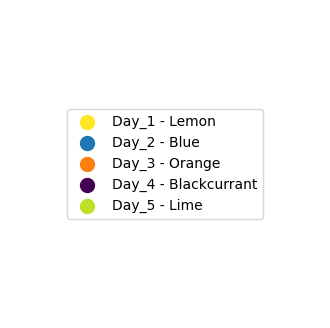

In [ ]:
# Count the number of CSV files
csv_files = glob.glob(location + "/*.h5")
csv_count = len(csv_files)

print("Number of CSV files in the folder:", csv_count)

def select_colors(num_colors):
    color_names = {
        "#fde725": "Lemon",
        "#bddf26": "Lime",
        "#7ad151": "Light Green",
        "#44bf70": "Green",
        "#22a884": "Shamrock",
        "#21918c": "Jungle Green",
        "#2a788e": "Sea Blue",
        "#355f8d": "Azure",
        "#414487": "Royal Blue",
        "#482475": "Purple",
        "#440154": "Blackcurrant",
        "#9edae5": "Light Blue",
        "#17becf": "Cyan",
        "#bcbd22": "Olive",
        "#7f7f7f": "Grey",
        "#e377c2": "Pink",
        "#8c564b": "Brown",
        "#9467bd": "Lavender",
        "#d62728": "Red",
        "#2ca02c": "Green",
        "#ff7f0e": "Orange",
        "#1f77b4": "Blue"
    }
    if num_colors <= len(color_names):
        selected_colors = random.sample(list(color_names.keys()), num_colors)
        return {color: color_names[color] for color in selected_colors}
    else:
        print("Number of colors requested exceeds the available colors.")
        return {}

# Example usage:
selected_colors = select_colors(csv_count)
# print(selected_colors)

# Extract list of hex codes
hex_codes_list = list(selected_colors.keys())
# print(hex_codes_list)



def get_hexcodelist():
    # Extract list of hex codes
    return list(selected_colors.keys())

def hex_to_name(hex_code):
    color_names = {
        "#fde725": "Lemon",
        "#bddf26": "Lime",
        "#7ad151": "Light Green",
        "#44bf70": "Green",
        "#22a884": "Shamrock",
        "#21918c": "Jungle Green",
        "#2a788e": "Sea Blue",
        "#355f8d": "Azure",
        "#414487": "Royal Blue",
        "#482475": "Purple",
        "#440154": "Blackcurrant",
        "#9edae5": "Light Blue",
        "#17becf": "Cyan",
        "#bcbd22": "Olive",
        "#7f7f7f": "Grey",
        "#e377c2": "Pink",
        "#8c564b": "Brown",
        "#9467bd": "Lavender",
        "#d62728": "Red",
        "#2ca02c": "Green",
        "#ff7f0e": "Orange",
        "#1f77b4": "Blue"
    }
    return color_names.get(hex_code.lower(), "Unknown Color")
plt.figure(figsize=(4, 4))
for i, code in enumerate(hex_codes_list):
    color_name = hex_to_name(code)
    # plt.scatter([i], [0], c=code, s=120)
    colorhexnames.append(color_name)
    plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
    print(f"Day_{i+1} color {code}: {color_name}")

# plt.legend()
plt.legend(loc='center')
plt.axis('off')

#plt.savefig('/content/drive/MyDrive/Cyclones/mawar/direction_fig/wind_speed_colors.png', dpi=100)
plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/direction_fig/wind_speed_colors.png', dpi=100)

plt.show()


In [ ]:
for i, code in enumerate(get_hexcodelist()):
    color_name = hex_to_name(code)
    # plt.scatter([i], [0], c=code, s=120)
    colorhexnames.append(color_name)
    # plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
    print(color_name)

Lemon
Blue
Orange
Blackcurrant
Lime


In [ ]:
def plot_wind_speed_direction(data, direction_label, coordinate_label, coordinate_data, coordinate_name, distance_data, colors, xlim=None):
    # color_names = [mcolors.to_hex(color) for color in colors]
        # plt.plot([], [], c=code, label=f"D{i+1} - {colorhexnames[i]}")

        # direction_data = data[data["Direction"] == direction_label]
        # coordinate = direction_data[coordinate_data]
        # distance = direction_data[distance_data]
        # wind_speed = direction_data["WindSpeed"]
    plt.figure(figsize=(18, 6))

    for i, code in enumerate(colors):
        color_name = hex_to_name(code)
        # plt.scatter([i], [0], c=code, s=120)
        colorhexnames.append(color_name)
        plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
        # print(f"Day_{i+1} color {code}: {color_name}")

    for i, color in enumerate(colors):


        direction_data = data[i][data[i]["Direction"] == direction_label]
        coordinate = direction_data[coordinate_data]
        distance = direction_data[distance_data]
        wind_speed = direction_data["WindSpeed"]

        clean_indices = np.logical_and((coordinate >= min(coordinate) - 2 * np.std(coordinate)),
                                       (coordinate <= max(coordinate) + 2 * np.std(coordinate)))
        clean_indices &= np.logical_and((wind_speed >= min(wind_speed) - 2 * np.std(wind_speed)),
                                        (wind_speed <= max(wind_speed) + 2 * np.std(wind_speed)))
        coordinate = coordinate[clean_indices]
        distance = distance[clean_indices]
        wind_speed = wind_speed[clean_indices]

        sorted_indices = np.argsort(distance)
        coordinate = coordinate.iloc[sorted_indices]
        distance = distance.iloc[sorted_indices]
        wind_speed = wind_speed.iloc[sorted_indices]

        # Plot data points
        plt.plot(distance, wind_speed, 'o', color=color, alpha=0.7)  # Plot against distance

        # plt.plot(distance, wind_speed, 'o', label=f"Dataset {i + 1}", alpha=0.7)

        # Find the index of the maximum wind speed
        max_wind_speed_index = np.argmax(wind_speed)
        # Plot the maximum wind speed point in green = 'go' such as 'r' for red, 'b' for blue, 'c' for cyan, etc.,
        # or you can specify colors using their RGB or RGBA values. For example, 'r' for red, 'b' for blue, and 'k' for black are some common color abbreviations.
        # 'k.'
        plt.plot(distance.iloc[max_wind_speed_index], wind_speed.iloc[max_wind_speed_index], 'k.', markersize=8, alpha=0.7) #,label='Max {} (m/s) '.format(f"{np.max(wind_speed):.2f}")

        # cyclone_eye_label = "cyclone_eye({}, {})".format(eye_lat, eye_lon)
        # # constant_coordinate = 'constant_{}({})'.format(coordinate_name, eye_lat if coordinate_name == "lat" else eye_lon)
        # plt.plot([], [], 'o', label=cyclone_eye_label, color='black')
        # plt.plot([], [], ' ', label=constant_coordinate)  # Placeholder for additional label

        fitting_method = "spline"
        fit_degree = 2

        if fitting_method == "spline":
            spline_fit = UnivariateSpline(distance, wind_speed, k=fit_degree, s=0)
            spline_x = np.linspace(min(distance), max(distance), 1000)
            fit_curve = spline_fit(spline_x)

        plt.plot(spline_x, fit_curve, color=color)



    plt.xlabel("Distance (km)")
    plt.ylabel("Wind Speed (m/s)")
    plt.title(f"Wind Speed vs. {direction_label} {coordinate_label}")
    plt.grid(True)
    # plt.legend()
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')
    # if xlim is not None:
    #     plt.xlim(xlim)
    # plt.savefig(f'wind_speed_distance_{direction_label.lower()}.png', dpi=100)

    #plt.savefig('/content/drive/MyDrive/Cyclones/mawar/graphs/wind_speed_distance_{}.png'.format(direction_label.lower()), dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/graphs/wind_speed_distance_{}.png'.format(direction_label.lower()), dpi=100)

    plt.show()

# # Get the list of CSV files in the folder
# folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# # Read the CSV files
# data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

# colors = get_hexcodelist()
# # # Define colors for each dataset
# # colors = ['red', 'blue']  # Add more colors if needed

# # Plot for South Direction
# plot_wind_speed_direction(data, "South", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

# plot_wind_speed_direction(data, "North", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

# plot_wind_speed_direction(data, "East", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

# plot_wind_speed_direction(data, "West", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))


In [ ]:
# Define a function for plotting wind speed against distance for a given direction
def plot_wind_speed_directions(direction,  colors):
    # color_names = [mcolors.to_hex(color) for color in colors]
    plt.figure(figsize=(18, 6))

    for i, code in enumerate(colors):
        color_name = hex_to_name(code)
        # plt.scatter([i], [0], c=code, s=120)
        colorhexnames.append(color_name)
        plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")
        # print(f"Day_{i+1} color {code}: {color_name}")

    for i, color in enumerate(colors):
        direction_data = data[i][data[i]["Direction"] == direction]

        distance = direction_data["Distance"]  # Assuming "Distance" is the column name for distance
        wind_speed = direction_data["WindSpeed"]

        plt.plot(distance, wind_speed, 'o', color=color, alpha=0.7)

        fitting_method = "spline"  # Options: "linear", "quadratic", "spline"
        fit_degree = 2  # Use 1 for linear, 2 for quadratic, higher for more complex curves

        if fitting_method == "spline":
            spline_fit_direction = UnivariateSpline(distance, wind_speed, k=fit_degree, s=0)

        distance_range = np.linspace(min(distance), max(distance), 1000)
        direction_fit = spline_fit_direction(distance_range)

        plt.plot(distance_range, direction_fit, '-', color=color)
        # plt.plot(distance, wind_speed, '-', color='blue')

        max_wind_speed_index = np.argmax(wind_speed)
        plt.plot(distance.iloc[max_wind_speed_index], wind_speed.iloc[max_wind_speed_index], 'k.', markersize=8)# label='Max {} (m/s) '.format(f"{np.max(wind_speed):.2f}"),

        # cyclone_eye_label = "cyclone_eye({}, {})".format(eye_lat,eye_lon)
        # plt.plot([], [], 'o', label=cyclone_eye_label, color='black')


    plt.xlabel("Distance (km)")
    plt.ylabel("Wind Speed (m/s)")
    plt.title(f"Wind Speed vs. Distance ({direction})")
    plt.grid(True)
    # plt.legend()
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')

    # plt.savefig(f'wind_speed_distace_{direction.lower()}.png', dpi=100)

    #plt.savefig('/content/drive/MyDrive/Cyclones/mawar/graphs/wind_speed_distace_{}.png'.format(direction.lower()), dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/graphs/wind_speed_distace_{}.png'.format(direction.lower()), dpi=100)

    plt.show()

# # Get the list of CSV files in the folder
# folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# # Read the CSV files
# data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

# colors = get_hexcodelist()
# # Plot for NorthEast
# plot_wind_speed_direction("NorthEast", colors)

# # Plot for NorthWest
# plot_wind_speed_direction("NorthWest", colors)

# # Plot for SouthEast
# plot_wind_speed_direction("SouthEast", colors)

# # Plot for SouthWest
# plot_wind_speed_direction("SouthWest", colors)


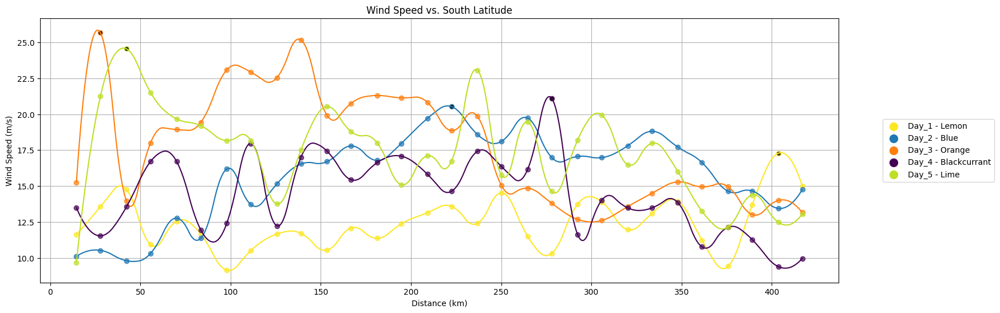

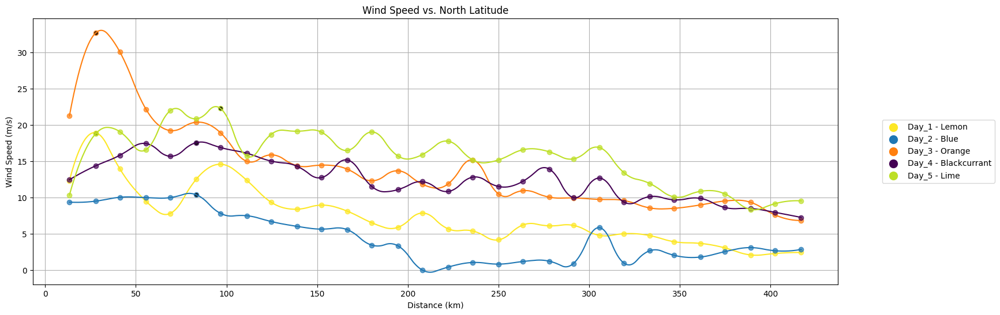

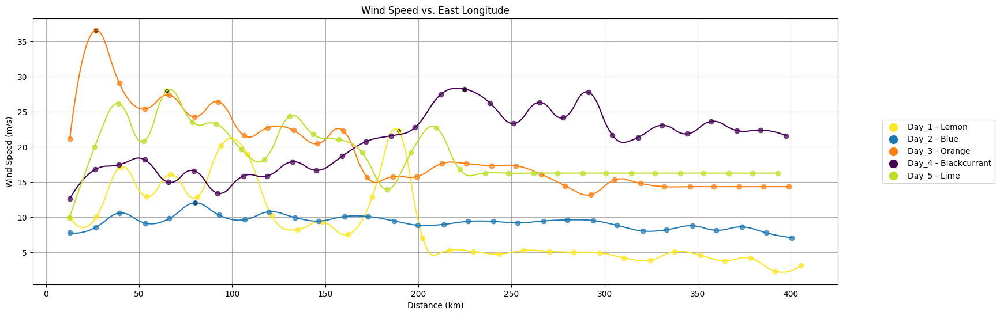

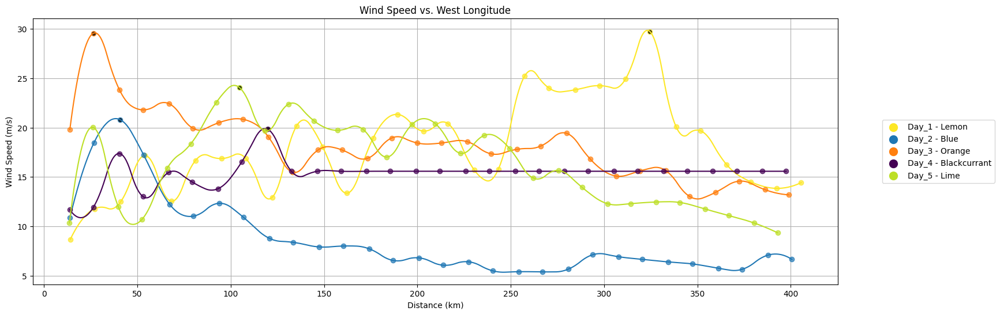

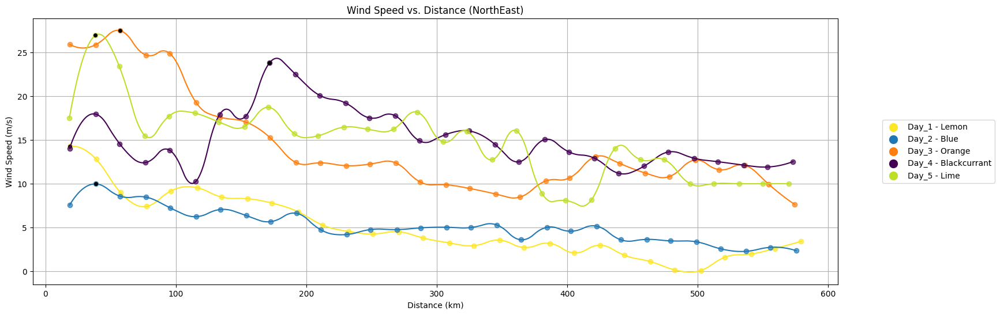

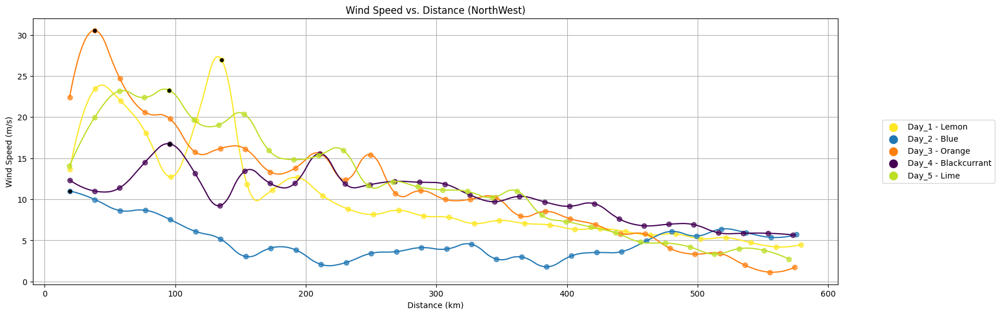

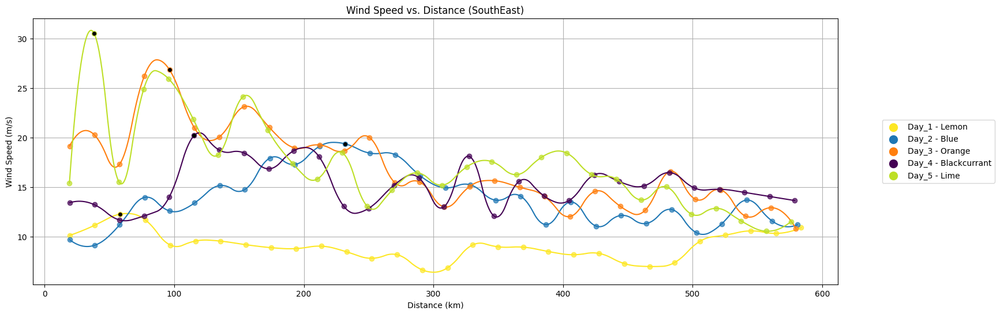

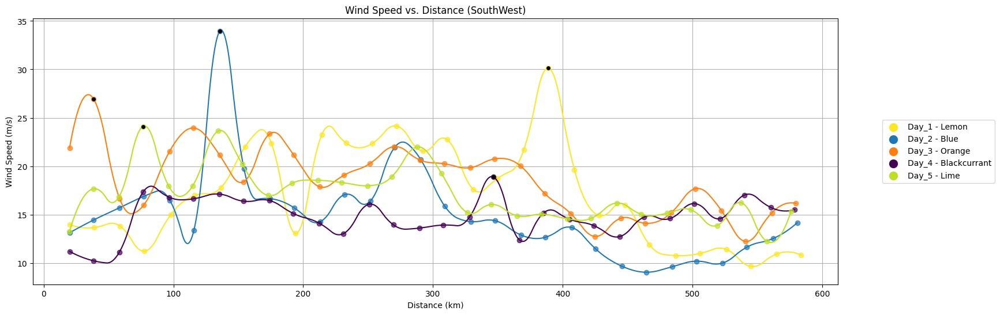

In [ ]:
# Get the list of CSV files in the folder
#folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
folder_path = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'

csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Read the CSV files
data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

colors = get_hexcodelist()
# # Define colors for each dataset
# colors = ['red', 'blue']  # Add more colors if needed

# Plot for South Direction
plot_wind_speed_direction(data, "South", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "North", "Latitude", "Latitude", "lat", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "East", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

plot_wind_speed_direction(data, "West", "Longitude", "Longitude", "lon", "Distance", colors, xlim=(0, 500))

# # Get the list of CSV files in the folder
# folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# # Read the CSV files
# data = [pd.read_csv(os.path.join(folder_path, csv_file)) for csv_file in csv_files]

# colors = get_hexcodelist()
# # Plot for NorthEast
plot_wind_speed_directions("NorthEast", colors)

# Plot for NorthWest
plot_wind_speed_directions("NorthWest", colors)

# Plot for SouthEast
plot_wind_speed_directions("SouthEast", colors)

# Plot for SouthWest
plot_wind_speed_directions("SouthWest", colors)

In [ ]:
print(wind_speed_cyclone_pass)

[7.92, 7.55, 10.17, 8.66, 7.76]


# **Graphs and reports**

In [ ]:
# def day_wise_details(direction,  colors):
#     for i, color in enumerate(colors):
#         direction_data = data[i][data[i]["Direction"] == direction]

#         distance = direction_data["Distance"]  # Assuming "Distance" is the column name for distance
#         wind_speed = direction_data["WindSpeed"]
max_wind_speed_dir_list=[]
max_wind_speed_dir = {}

def day_wise_details(data, direction_label): #, coordinate_label, coordinate_data, coordinate_name, distance_data, colors, xlim=None):
    # for i, color in enumerate(colors):
    # direction_data = data[i][data[i]["Direction"] == direction_label]
    direction_data = data[data["Direction"] == direction_label]
    # coordinate = direction_data[coordinate_data]
    # distance = direction_data[distance_data]
    wind_speed = direction_data["WindSpeed"]

    max_wind_speed_dir = {
        "direction": direction_label,
        "max_wind_speed": round(np.max(wind_speed), 2)
    }

    max_wind_speed_dir_list.append(max_wind_speed_dir)

    return round(np.max(wind_speed),2)



#folder_path = '/content/drive/MyDrive/Cyclones/mawar/csvcyclones'
folder_path = '/content/drive/MyDrive/Cyclones/biparjoy/csvcyclones'
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]


# pattern = r'(\d+)_([A-Za-z]{2})_'

# # Iterate through each CSV file
# for csv_file in csv_files:
#     # Extract numbers and letters from the file name using regular expressions
#     match = re.search(pattern, csv_file)

# for csv_file in csv_files:
#     # Read the CSV file
#     file_path = os.path.join(folder_path, csv_file)
#     data = pd.read_csv(file_path)


i=0

#with open('/content/drive/MyDrive/Cyclones/mawar/tables/day_wise_report.csv', 'a', newline='') as csvfile:
with open('/content/drive/MyDrive/Cyclones/biparjoy/tables/day_wise_report.csv', 'a', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest', 'Maxspeed', 'Direction'])

# Iterate through each CSV file
for csv_file in csv_files:

    day_wise_report.clear()
    max_wind_speed_dir.clear()
    max_wind_speed_dir_list.clear()
    # Read the CSV file
    file_path = os.path.join(folder_path, csv_file)
    data = pd.read_csv(file_path)

    # Example file name
    file_name = file_path

    # Extracting characters using string manipulation
    parts = file_name.split('/')  # Splitting the file path by directory separators
    file_name = parts[-1]  # Extracting just the file name
    parts = file_name.split('_')  # Splitting the file name by underscores
    jday = parts[3]  # Extracting the part representing Julian day
    adp = parts[4].split('.')[0]  # Extracting the part representing direction without the extension

    # day_wise_report.append('File: {}'.format(csv_file))
    day_wise_report.append('Day_{}'.format(i+1))
    day_wise_report.append('{}_{}'.format(jday, adp))
    day_wise_report.append(wind_speed_cyclone_pass[i])

    day_wise_report.append(day_wise_details(data, "North"))
    day_wise_report.append(day_wise_details(data, "South"))
    day_wise_report.append(day_wise_details(data, "West"))
    day_wise_report.append(day_wise_details(data, "East"))
    day_wise_report.append(day_wise_details(data, "NorthEast"))
    day_wise_report.append(day_wise_details(data, "SouthEast"))
    day_wise_report.append(day_wise_details(data, "NorthWest"))
    day_wise_report.append(day_wise_details(data, "SouthWest"))

    # Find the dictionary with the highest max_wind_speed
    max_wind_speed_dict = max(max_wind_speed_dir_list, key=lambda x: x["max_wind_speed"])

    # Extract the direction and maximum wind speed
    highest_direction = max_wind_speed_dict["direction"]
    highest_max_wind_speed = max_wind_speed_dict["max_wind_speed"]

    day_wise_report.append(highest_max_wind_speed)
    day_wise_report.append(highest_direction)

    #print(max_wind_speed_dir_list)
    print(max_wind_speed_dict)


    # Print the day-wise report
    print(day_wise_report)

    i=i+1
    # Optionally, you can save the day-wise report to a CSV file
    #with open('/content/drive/MyDrive/Cyclones/mawar/tables/day_wise_report.csv', 'a', newline='') as csvfile:
    with open('/content/drive/MyDrive/Cyclones/biparjoy/tables/day_wise_report.csv', 'a', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest'])
        writer.writerow(day_wise_report)
        # Save the wind speed data to a CSV file
    # with open('/content/drive/MyDrive/data/student_bhuvan_kandhi/table2/day_wise_report.csv', 'a', newline='') as csvfile:
    #     writer = csv.writer(csvfile)
    #     # if i == 1:  # Write header only in the first iteration
    #     writer.writerow(['Day', 'julian_day', 'Center_WS', 'North', 'South', 'West', 'East', 'NorthEast', 'SouthEast', 'NorthWest', 'SouthWest'])
    #     writer.writerow(day_wise_report)



{'direction': 'SouthWest', 'max_wind_speed': 30.14}
['Day_1', '157_NS', 7.92, 18.89, 17.28, 29.74, 22.27, 14.28, 12.28, 26.97, 30.14, 30.14, 'SouthWest']
{'direction': 'SouthWest', 'max_wind_speed': 33.96}
['Day_2', '159_NS', 7.55, 10.35, 20.53, 20.82, 12.04, 9.97, 19.37, 11.02, 33.96, 33.96, 'SouthWest']
{'direction': 'East', 'max_wind_speed': 36.54}
['Day_3', '161_NS', 10.17, 32.64, 25.66, 29.57, 36.54, 27.51, 26.85, 30.55, 26.95, 36.54, 'East']
{'direction': 'East', 'max_wind_speed': 28.22}
['Day_4', '162_NS', 8.66, 17.54, 21.11, 19.84, 28.22, 23.84, 20.2, 16.75, 18.88, 28.22, 'East']
{'direction': 'SouthEast', 'max_wind_speed': 30.5}
['Day_5', '163_NS', 7.76, 22.23, 24.54, 24.04, 27.97, 26.96, 30.5, 23.28, 24.1, 30.5, 'SouthEast']


In [ ]:
print(trackc_lats)
print(trackc_lons)

cyc_tracklats = list(trackc_lats)
cyc_tracklons = list(trackc_lons)

print(cyc_tracklats)
print(cyc_tracklons)


[13.42, 16.1, 16.87, 17.57, 19.54]
[67.28, 64.68, 67.4, 66.19, 67.17]
[13.42, 16.1, 16.87, 17.57, 19.54]
[67.28, 64.68, 67.4, 66.19, 67.17]


In [ ]:
print(wind_speed_cyclone_pass)

[7.92, 7.55, 10.17, 8.66, 7.76]


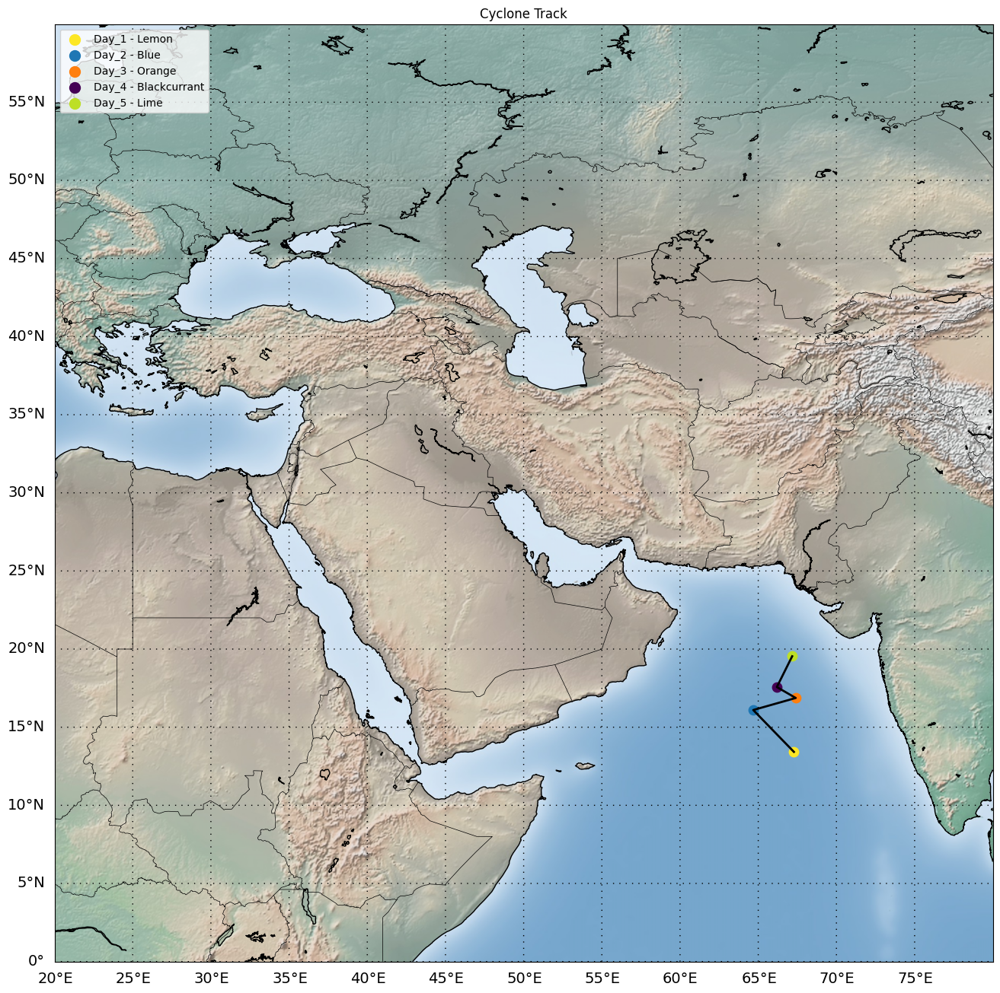

In [ ]:
def plot_track(trackc_lats, trackc_lons, colors):

    # min_lat = 0.0  # Minimum latitude
    # max_lat = 60.0  # Maximum latitude
    # min_lon = 20.0  # Minimum longitude
    # max_lon = 80.0  # Maximum longitude

    fig = plt.figure(figsize=(20, 16), facecolor='white')
    ax = fig.add_subplot(111)

    my_map = Basemap(projection='cyl', lat_1=20, lon_0=130, resolution='i', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat)
    my_map.drawcoastlines()
    my_map.drawcountries()

    parallels = np.arange(min_lat, max_lat, 5)  # Define the latitude parallels you want to show
    meridians = np.arange(min_lon, max_lon, 5)  # Define the longitude meridians you want to show

    my_map.drawparallels(parallels, labels=[1, 0, 0, 0], fontsize=14, linewidth=1, color='black', dashes=[1, 5])
    my_map.drawmeridians(meridians, labels=[0, 0, 0, 1], fontsize=14, linewidth=1, color='black', dashes=[1, 5])

    month_name, formated_date, date = gregorian_date_from_julian_day(int(year), int(julian_day))
    #print(julian_day, year)
    # plt.title('EOS-06 SCAT Wind Vorticity -  {}-{}-{}'.format(formated_date, month_name, year), fontsize=25)
    # plt.title('Cyclone Track')

    plt.title('Cyclone Track')

    # Convert latitude and longitude to map projection coordinates
    x1, y1 = my_map(trackc_lons, trackc_lats)

    # Plot the track with colored projection
    for i, (x, y) in enumerate(zip(x1, y1)):
        my_map.scatter(x, y, c=colors[i], marker='o', s=80)

    # Plot a line passing through the track points
    my_map.plot(x1, y1, color='black', linewidth=2)

    for i, code in enumerate(hex_codes_list):
        color_name = hex_to_name(code)
        # plt.scatter([i], [0], c=code, s=120)
        colorhexnames.append(color_name)
        plt.scatter([], [], c=code, s=100, label=f"Day_{i+1} - {color_name}")

    cbar = plt.colorbar(cnt, location='right', orientation='vertical', shrink=0.6, pad=0.03)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Wind Speed (m/s)', fontsize=15, color='black', labelpad=10)
    cbar.ax.tick_params(length=7, width=2, color='black')
    # cbar.set_ticks(color_ticks)
    # cbar.set_ticklabels(color_labels, fontsize=20, color='black')

    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_labels, fontsize=20, color='black')


    my_map.shadedrelief()

    plt.legend(loc='upper left')  # Adjust 'upper left' as needed
    # Save the image as a file (in this case, as a PNG file)

    #plt.savefig('/content/drive/MyDrive/Cyclones/mawar/direction_fig/track_cyclone.png', dpi=100)
    plt.savefig('/content/drive/MyDrive/Cyclones/biparjoy/direction_fig/track_cyclone.png', dpi=100)

    plt.show()
    plt.close()

# # Example track data
# trackc_lats = [40, 45, 50, 55, 60]
# trackc_lons = [-100, -95, -90, -85, -80]
colors = get_hexcodelist()  # Assuming this function returns a list of hex color codes

# Plot the track
plot_track(cyc_tracklats, cyc_tracklons, colors)

